In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import squarify
import numpy as np
from collections import Counter
import matplotlib.cm as cm
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud
from pymystem3 import Mystem
import pymorphy2
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import plot_model

In [6]:
data = pd.read_json('/Users/beskrovnayaaaaa/Downloads/dataset.json', orient='records')
data

,name,gender,age,place,salary,employment,experience,education,tags
0,Game designer,Мужчина,38,Казань,25000₽,"полная занятость, частичная занятость, проектн...",19 лет 5 месяцев,Высшее образование (Магистр),"[Веб-дизайн, Графические редакторы, Графически..."
1,Game Designer,Мужчина,27,Балашиха,,"полная занятость, частичная занятость, проектн...",9 месяцев,Среднее специальное образование,"[Ответственность, Усидчивость, Поиск информаци..."
2,Game Designer,Мужчина,25,Сербия,,полная занятость,2 года 5 месяцев,Неоконченное высшее образование,"[Работа в команде, Unity, Git hub, Trello, Mir..."
3,Game designer,Male,31,Moscow,,"full time, project work",10 years 8 months,Higher education,"[Game design, Unity, Git, C#, Blender 3D]"
4,Game designer,Мужчина,32,Санкт-Петербург,1500$,полная занятость,7 лет 4 месяца,Высшее образование (Магистр),"[Английский язык, Пользователь ПК, Грамотная р..."
...,...,...,...,...,...,...,...,...,...
12778,Game designer,Мужчина,,Москва,120000₽,полная занятость,6 лет 11 месяцев,Образование,"[Cinema 4D, 3ds Max, Sony Vegas, 3D Моделирова..."
12779,Дизайнер-консультант,Женщина,38,Москва,25000₽,"частичная занятость, проектная работа",13 лет 4 месяца,Среднее специальное образование,[Консультирование клиентов]
12780,Графический дизайнер,Женщина,,Москва,,полная занятость,8 лет 4 месяца,Высшее образование,"[Adobe Lightroom, CorelDRAW, Adobe Photoshop, ..."
12781,Web Designer / UI UX Designer,Женщина,,Москва,60000₽,"полная занятость, частичная занятость, проектн...",11 лет 4 месяца,Высшее образование,"[Графический дизайн, Web-дизайн, Adobe Photosh..."


In [3]:
data['name'].value_counts()

Дизайнер                                              1518
Графический дизайнер                                  1179
Веб-дизайнер                                           378
Web-дизайнер                                           298
3D-моделлер                                            266
                                                      ... 
Middle. UX/UI дизайнер                                   1
Digital designer | UI/UX designer                        1
UX/UI дизайнер, веб-дизайнер, дизайнер интерфейсов       1
UI/UX, Web-дизайнер                                      1
Web Designer / UI UX Designer                            1
Name: name, Length: 4428, dtype: int64

In [4]:
data['name'].unique()

array(['Game designer', 'Game Designer', 'Game designer, level designer.',
       ..., 'Jewelry Designer', 'Коммуникативный дизайнер',
       'Web Designer / UI UX Designer'], dtype=object)

In [7]:
data['name'].nunique()

4428

In [13]:
df = data.copy()

# Функция для нормализации названий вакансий
def normalize_job_title(title):
    # Приведение к нижнему регистру
    normalized = title.lower()
    
    # Замена специальных символов, знаков препинания и лишних пробелов
    normalized = re.sub(r'[^\w\s]', ' ', normalized)
    normalized = re.sub(r'\s+', ' ', normalized).strip()
    
    # Замена синонимов и исправление опечаток
    replacements = {
        'webdesigner': 'web дизайнер',
        'product дизайнер': 'product',
        'дизайн': 'дизайнер',
        'webdesign': 'web дизайнер',
        'web designer': 'web дизайнер',
        'вебдизайнер': 'web дизайнер',
        'вебдизайн': 'web дизайнер',
        'веб дизайн': 'web дизайнер',
        'веб дизайнер': 'web дизайнер',
        'game designer': 'game дизайнер',
        'gamedesign': 'game дизайнер',
        'game design': 'game дизайнер',
        'gamedesigner': 'game дизайнер',
        'гейм дизайнер': 'game дизайнер',
        'геймдизайнер': 'game дизайнер',
        'гейм дизайн': 'game дизайнер',
        'геймдизайн': 'game дизайнер',
        'ui ux designer': 'ux/ui дизайнер',
        'ux ui designer': 'ux/ui дизайнер',
        'uiux designer': 'ux/ui дизайнер',
        'ui ux design': 'ux/ui дизайнер',
        'uiux design': 'ux/ui дизайнер',
        'uxui designer': 'ux/ui дизайнер',
        'uxui design': 'ux/ui дизайнер',
        'ux ui design': 'ux/ui дизайнер',
        'ui ux дизайнер': 'ux/ui дизайнер',
        'ux ui дизайнер': 'ux/ui дизайнер',
        'uiux дизайнер': 'ux/ui дизайнер',
        'ui ux дизайн': 'ux/ui дизайнер',
        'uiux дизайн': 'ux/ui дизайнер',
        'uxui дизайнер': 'ux/ui дизайнер',
        'uxui дизайн': 'ux/ui дизайнер',
        'ux ui дизайн': 'ux/ui дизайнер',
        'моушн дизайн': 'motion дизайнер',
        'моушн дизайнер': 'motion дизайнер',
        'moiton designer': 'motion дизайнер',
        'designer': 'дизайнер',
        'motion design': 'motion дизайнер',
        'motion дизайнерер': 'motion дизайнер',
        'графический дизайнер': 'graphic дизайнер',
        'моушен дизайнер': 'motion дизайнер',
        'artist': 'дизайнер',
        'аниматор': 'motion дизайнер',
        'graphic design': 'graphic дизайнер',
        'graphics дизайнер': 'graphic дизайнер',
        'диза йнер': 'дизайнер',
        'графический': 'graphic',
        'художник': 'дизайнер',
        'ux ui': 'ux/ui',
        'ui ux': 'ux/ui',
        'художник анимации': 'motion дизайнер',
        'моушн': 'motion',
        'graphics': 'graphic',
        'начинающий специалист': 'дизайнер',
        'дизайнерер': 'дизайнер',
        'motionдизайнер': 'motion дизайнер',
        'визуализатор': 'motion дизайнер',
        'видеодизайнер': 'дизайнер',
        'анимация': 'дизайнер',
        'graph': 'graphic',
        'режиссер монтажа': 'motion дизайнер',
        'видеомонтажер': 'motion дизайнер',
        'видео монтажер': 'motion дизайнер',
        'дизайнерs': 'дизайнер',
        'adobe after effects': 'motion дизайнер',
        'graphicic': 'graphic',
        'videomaker': 'motion дизайнер',
        'design': 'дизайнер',
        'games': 'game',
        'продуктовый': 'product',
        'график': 'graphic',
        'grafik': 'graphic',
        'desinger': 'дизайнер',
        'uxui': 'ux/ui',
        'веб': 'web',
        'вэб': 'web',
        'web мастер': 'web дизайнер',
        'диайнер': 'дизайнер',
        'графически й': 'graphic',
        'графическому дизайну': 'graphic дизайнер',
        'гейм': 'game',
        'gameдизанер': 'game дизайнер',
        'игр': 'game',
        'game master': 'game дизайнер',
        '3d animator': 'motion дизайнер',
        'левел дизайнер': 'game дизайнер',
        'level': 'game',
        'левел': 'game',
        'художница': 'дизайнер',
        'моделлер': 'motion',
        'animator': 'motion',
        'graphicи': 'graphic',
        'графического': 'graphic',
        'дизайнера': 'дизайнер'
   
    }
    
    for pattern, replacement in replacements.items():
        normalized = re.sub(pattern, replacement, normalized)
    
    return normalized

# Применяем функцию к столбцу 'name' в датасете
df['normalized_name'] = df['name'].apply(normalize_job_title)

In [14]:
df

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name
0,Game designer,Мужчина,38,Казань,25000₽,"полная занятость, частичная занятость, проектн...",19 лет 5 месяцев,Высшее образование (Магистр),"[Веб-дизайн, Графические редакторы, Графически...",game дизайнер
1,Game Designer,Мужчина,27,Балашиха,,"полная занятость, частичная занятость, проектн...",9 месяцев,Среднее специальное образование,"[Ответственность, Усидчивость, Поиск информаци...",game дизайнер
2,Game Designer,Мужчина,25,Сербия,,полная занятость,2 года 5 месяцев,Неоконченное высшее образование,"[Работа в команде, Unity, Git hub, Trello, Mir...",game дизайнер
3,Game designer,Male,31,Moscow,,"full time, project work",10 years 8 months,Higher education,"[Game design, Unity, Git, C#, Blender 3D]",game дизайнер
4,Game designer,Мужчина,32,Санкт-Петербург,1500$,полная занятость,7 лет 4 месяца,Высшее образование (Магистр),"[Английский язык, Пользователь ПК, Грамотная р...",game дизайнер
...,...,...,...,...,...,...,...,...,...,...
12778,Game designer,Мужчина,,Москва,120000₽,полная занятость,6 лет 11 месяцев,Образование,"[Cinema 4D, 3ds Max, Sony Vegas, 3D Моделирова...",game дизайнер
12779,Дизайнер-консультант,Женщина,38,Москва,25000₽,"частичная занятость, проектная работа",13 лет 4 месяца,Среднее специальное образование,[Консультирование клиентов],дизайнер консультант
12780,Графический дизайнер,Женщина,,Москва,,полная занятость,8 лет 4 месяца,Высшее образование,"[Adobe Lightroom, CorelDRAW, Adobe Photoshop, ...",graphic дизайнер
12781,Web Designer / UI UX Designer,Женщина,,Москва,60000₽,"полная занятость, частичная занятость, проектн...",11 лет 4 месяца,Высшее образование,"[Графический дизайн, Web-дизайн, Adobe Photosh...",web дизайнер ux/ui дизайнер


In [15]:
df['normalized_name'].nunique()

2786

In [16]:
unique_values = df['normalized_name'].unique()
unique_values[100:200]

array(['3d motion game dev', 'middle 2d дизайнер', 'sound дизайнер',
       '3d дизайнер game дизайнер', 'стажер game дизайнер game дизайнер',
       'junior game дизайнер младший game дизайнер',
       'креатор project manager game дизайнер',
       'младший game дизайнер junior game disigner',
       'lead senior unreal engine developer',
       'producer lead game дизайнер midcore casual game gameификация b2c продуктов',
       'concept art game art developing', 'game disigner',
       'game дизайнер programmer 3d дизайнер',
       '2d дизайнер mobile casual game', '3d дизайнер',
       'art director cg generalist game дизайнер',
       'cg generalist game дизайнер production assistant',
       'game дизайнер game дизайнер нарративный',
       'game дизайнер game дизайнер сценарист',
       'junior game дизайнер game дизайнер',
       'game дизайнер lead дизайнер 2d дизайнер generalist',
       'game дизайнер game дизайнер дизайнер уровней game дизайнер gameовой аналитик game analys

In [17]:
keywords = ['motion', 'дизайнер', 'graphic', 'ux/ui', 'web', 'game', 'product']

def standardize_and_remove_duplicates(title, keywords):
    # Разбиваем название должности на отдельные слова
    words = title.split()
    words = sorted(words)
    
    # Оставляем только ключевые слова и убираем повторы с использованием множества
    filtered_words = list(set([word for word in words if word in keywords]))
    
    # Строим стандартизированное название должности из уникальных ключевых слов
    standardized_title = ' '.join(filtered_words)
    
    return standardized_title

# Применяем функцию к столбцу 'normalized_name' в датасете
df['standardized_name'] = df['normalized_name'].apply(lambda x: standardize_and_remove_duplicates(x, keywords))

In [18]:
empty_rows = df[df['standardized_name'].str.strip().eq('') | df['standardized_name'].isna()]
empty_rows

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name
247,Producer (GameDev),Мужчина,39,Москва,,"полная занятость, частичная занятость",7 лет,Неоконченное высшее образование,"[Креативность, Ответственность, Статистический...",producer gamedev,
252,producer,Женщина,29,Москва,3500$,"полная занятость, проектная работа",9 лет 7 месяцев,Высшее образование,"[C#, Python, JavaScript, Unity, UnrealEngine, ...",producer,
267,Продюсер / Режиссёр,Мужчина,36,Сербия,3000€,"полная занятость, частичная занятость, проектн...",14 лет 11 месяцев,Высшее образование,"[Unity, Написание сценариев, Написание рекламн...",продюсер режиссёр,
302,Lead/Senior Unreal Engine Developer,Мужчина,34,Тбилиси,250000₽,полная занятость,11 лет 10 месяцев,Высшее образование,"[Математическое программирование, Английский я...",lead senior unreal engine developer,
372,Unity Developer,Мужчина,25,Санкт-Петербург,,полная занятость,6 лет 7 месяцев,Высшее образование (Бакалавр),"[C#, Unity, Adobe Photoshop, .NET Framework, У...",unity developer,
...,...,...,...,...,...,...,...,...,...,...,...
10803,Автор работ по графическому дизайну,Мужчина,27,Ташкент,30000₽,"полная занятость, частичная занятость, проектн...",3 года 9 месяцев,Неоконченное высшее образование,"[Исполнительность, Креативность, Adobe Photosh...",автор работ по графическому дизайнеру,
11286,Art director,Female,36,Moscow,,"full time, project work",15 years 9 months,Higher education (master),"[Web Design, 3D-графика, Social Media Marketin...",art director,
11422,Макетчик - специалист по производству наружной...,Мужчина,58,Москва,60000₽,полная занятость,37 лет 9 месяцев,Неоконченное высшее образование,[Персидский — Родной],макетчик специалист по производству наружной р...,
12367,Арт-директор,Мужчина,26,Москва,150000₽,"полная занятость, частичная занятость, проектн...",5 лет 5 месяцев,Высшее образование (Бакалавр),"[Графический дизайн, Adobe Illustrator, Adobe ...",арт директор,


In [19]:
df = df[df['standardized_name'].str.strip().astype(bool)]

In [20]:
df.reset_index(drop=True, inplace=True)

In [21]:
df['standardized_name'].nunique()

44

In [22]:
df['standardized_name'].unique()

array(['game дизайнер', 'game дизайнер product', 'дизайнер', 'game',
       'game дизайнер ux/ui', 'graphic дизайнер', 'дизайнер ux/ui',
       'game product', 'motion дизайнер', 'motion game дизайнер',
       'game ux/ui', 'web game дизайнер ux/ui', 'web game дизайнер',
       'motion game', 'product', 'motion graphic дизайнер',
       'web graphic дизайнер', 'motion', 'game graphic дизайнер',
       'motion graphic', 'web дизайнер ux/ui', 'дизайнер product',
       'web graphic дизайнер ux/ui', 'web', 'web дизайнер',
       'graphic дизайнер ux/ui', 'ux/ui', 'motion graphic дизайнер web',
       'дизайнер product ux/ui', 'motion ux/ui', 'web ux/ui',
       'product ux/ui', 'motion дизайнер web',
       'web дизайнер product ux/ui', 'motion дизайнер ux/ui',
       'web graphic', 'graphic дизайнер product ux/ui',
       'graphic product ux/ui web дизайнер', 'motion дизайнер web ux/ui',
       'motion graphic ux/ui web дизайнер', 'motion web ux/ui',
       'motion graphic дизайнер ux/ui

In [26]:
dataframe = df.copy()

w = ['web', 'motion', 'game', 'ux/ui', 'graphic', 'product']
s = 'дизайнер'


def process_standardized_name(name):
    global w, s
    
    # Разбиваем строку на отдельные слова
    words = name.split()
    
    # Проверяем, есть ли слово 'дизайнер' в строке и какие ключевые слова из списка w содержатся в строке
    if s in words and any(word in w for word in words):
        # Формируем новую строку, исключая слово 'дизайнер'
        new_words = [word for word in words if word != s]
        return ' '.join(new_words)
    else:
        return name

# Применение функции к столбцу 'standardized_name'
dataframe['standardized_name'] = dataframe['standardized_name'].apply(process_standardized_name)

In [27]:
dataframe['standardized_name'].unique()

array(['game', 'game product', 'дизайнер', 'game ux/ui', 'graphic',
       'ux/ui', 'motion', 'motion game', 'web game ux/ui', 'web game',
       'product', 'motion graphic', 'web graphic', 'game graphic',
       'web ux/ui', 'web graphic ux/ui', 'web', 'graphic ux/ui',
       'motion graphic web', 'product ux/ui', 'motion ux/ui',
       'motion web', 'web product ux/ui', 'graphic product ux/ui',
       'graphic product ux/ui web', 'motion web ux/ui',
       'motion graphic ux/ui web', 'motion graphic ux/ui', 'web product'],
      dtype=object)

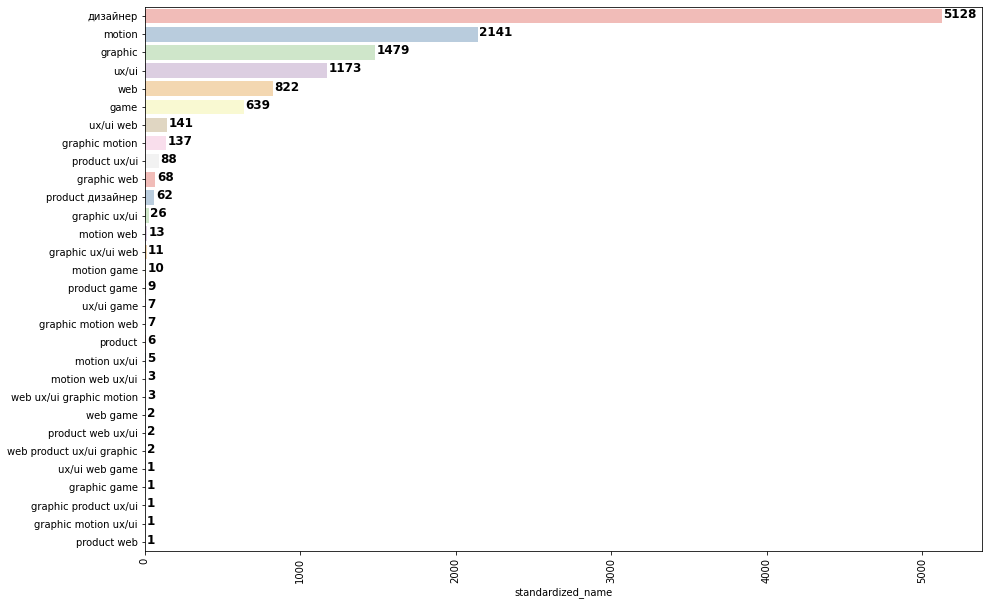

In [17]:
# Создание столбчатой диаграммы
plt.figure(figsize=(15, 10))
sns.barplot(x=dataframe['standardized_name'].value_counts(), y=dataframe['standardized_name'].value_counts().index, palette=sns.color_palette('Pastel1'))

# Добавление числа наблюдений над каждым столбцом
for i, v in enumerate(dataframe['standardized_name'].value_counts()):
    plt.text(v + 10, i + 0.1, str(v), color='black', fontsize=12, fontweight='bold')

plt.xticks(rotation=90)
plt.show()

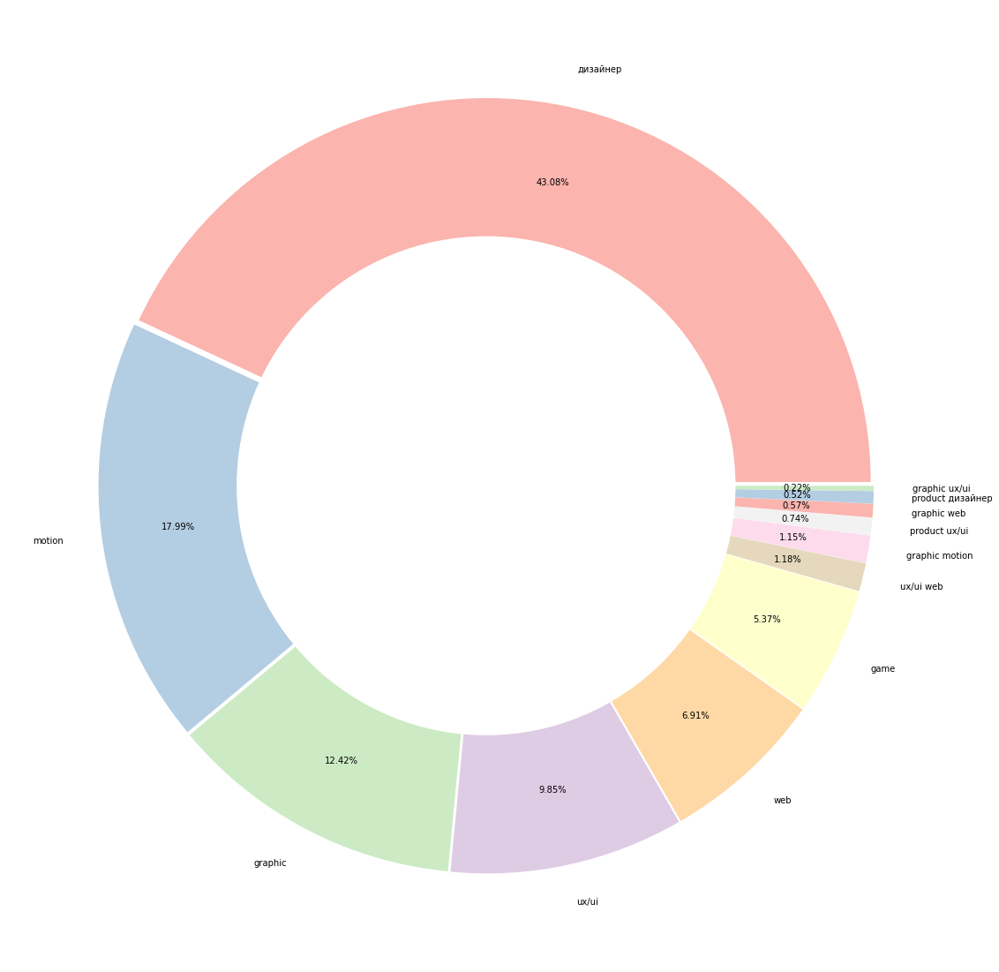

In [18]:
# Подготовка данных для построения диаграммы
counts = dataframe['standardized_name'].value_counts()
top_categories = counts.nlargest(12)  # Выбор первых 12 по величине значений
labels = top_categories.index

plt.figure(figsize=(30, 20))

# Построение круговой диаграммы для первых 12 категорий
plt.pie(top_categories, labels=labels, autopct='%1.2f%%', colors=sns.color_palette('Pastel1'), pctdistance=0.80,
        explode=[0.01] * len(labels))  # Используем explode для выделения каждой секции

# Добавление белого круга в центр для создания отверстия (donut chart)
hole = plt.Circle((0, 0), 0.65, facecolor='white')
plt.gcf().gca().add_artist(hole)

plt.show()

In [19]:
# Функция для нормализации названий гендера
def normalize_gender_title(title):
    # Приведение к нижнему регистру
    normalized = title.lower()
    
    # Замена специальных символов, знаков препинания и лишних пробелов
    normalized = re.sub(r'[^\w\s]', ' ', normalized)
    normalized = re.sub(r'\s+', ' ', normalized).strip()
    
    # Замена синонимов и исправление опечаток
    replacements = {
        'male': 'мужчина',
        'female': 'женщина',
        'gender unknown': 'пол не указан',
        'kişi': 'пол не указан',
        'ер': 'пол не указан',
        'чоловік': 'пол не указан',
        'feмужчина': 'мужчина'
    }
    
    for pattern, replacement in replacements.items():
        normalized = re.sub(pattern, replacement, normalized)
    
    return normalized

# Применяем функцию к столбцу 'gender' в датасете
dataframe['gender'] = dataframe['gender'].apply(normalize_gender_title)

In [20]:
dataframe['gender'].value_counts()

мужчина          7220
женщина          4749
пол не указан      20
Name: gender, dtype: int64

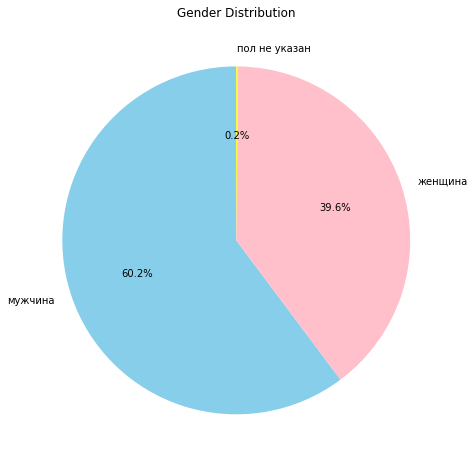

In [21]:
# Вычисление количества мужчин и женщин
gender_counts = dataframe['gender'].value_counts()

# Построение круговой диаграммы
plt.figure(figsize=(8, 8))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'pink', 'yellow'])

# Добавление заголовка
plt.title('Gender Distribution')

# Отображение диаграммы
plt.show()

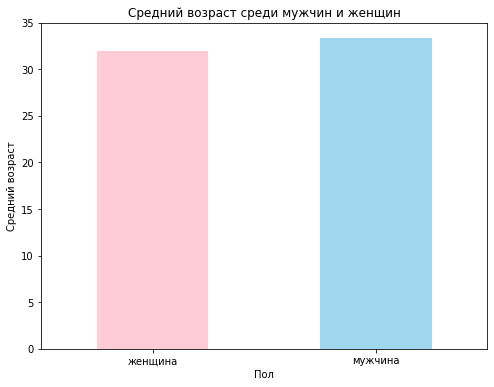

In [22]:
dataframe['age_numeric'] = pd.to_numeric(df['age'], errors='coerce')

# Удаление строк с NaN в столбце 'age_numeric'
df_valid_age = dataframe.dropna(subset=['age_numeric'])

# Фильтрация данных по значениям 'male' и 'female' в столбце 'gender'
filtered_df = df_valid_age[df_valid_age['gender'].isin(['женщина', 'мужчина'])]

# Группировка данных по полу и вычисление среднего возраста для каждой группы
average_age_by_gender = filtered_df.groupby('gender')['age_numeric'].mean()

# Построение диаграммы среднего возраста для мужчин и женщин
plt.figure(figsize=(8, 6))
average_age_by_gender.plot(kind='bar', color=['pink', 'skyblue'], alpha=0.8)
plt.title('Средний возраст среди мужчин и женщин')
plt.xlabel('Пол')
plt.ylabel('Средний возраст')
plt.xticks(rotation=0)
plt.show()

In [23]:
# Найти минимальный возраст
min_age = dataframe['age_numeric'].min()
# Найти максимальный возраст
max_age = dataframe['age_numeric'].max()

print(f'Минимальный возраст: {min_age}')
print(f'Максимальный возраст: {max_age}')

Минимальный возраст: 16.0
Максимальный возраст: 123.0


In [24]:
# Найти индекс строки с минимальным возрастом
idx_min_age = dataframe['age_numeric'].idxmin()

# Найти индекс строки с максимальным возрастом
idx_max_age = dataframe['age_numeric'].idxmax()

# Вывести строку с минимальным возрастом
print("Строка с минимальным возрастом:")
print(dataframe.loc[idx_min_age])

# Вывести строку с максимальным возрастом
print("\nСтрока с максимальным возрастом:")
print(dataframe.loc[idx_max_age])

Строка с минимальным возрастом:
name                                                      Веб-дизайнер
gender                                                         мужчина
age                                                                 16
place                                                        Астрахань
salary                                                          2000₽ 
employment                                            полная занятость
experience                                            4 года 5 месяцев
education                                                  Образование
tags                 [Веб-дизайн, SEO, Adobe Photoshop, Web-дизайн,...
normalized_name                                         web дизайнерер
standardized_name                                                  web
age_numeric                                                       16.0
Name: 4974, dtype: object

Строка с максимальным возрастом:
name                                                    

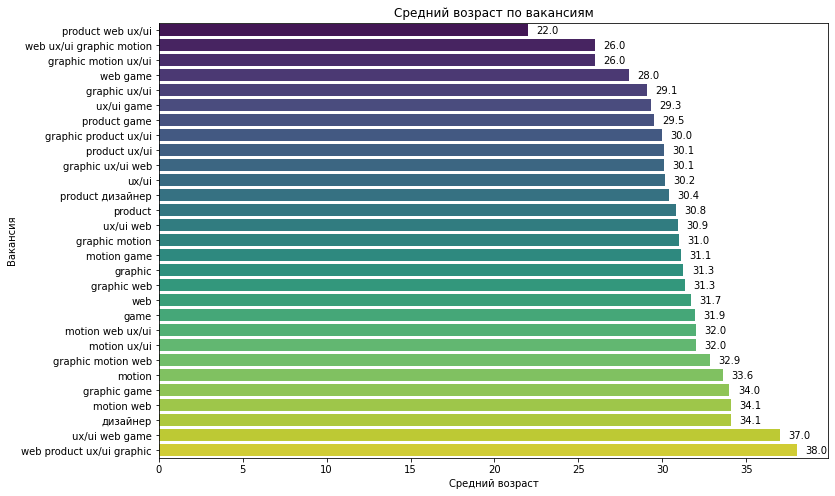

In [25]:
# Группировка данных по вакансиям и вычисление среднего возраста для каждой вакансии
average_age_by_position = df_valid_age.groupby('standardized_name')['age_numeric'].mean().sort_values()

# Построение графика среднего возраста по вакансиям
plt.figure(figsize=(12, 8))
sns.barplot(x=average_age_by_position.values, y=average_age_by_position.index, palette='viridis')
plt.xlabel('Средний возраст')
plt.ylabel('Вакансия')
plt.title('Средний возраст по вакансиям')

# Добавление значений среднего возраста к каждому бару на графике
for i, v in enumerate(average_age_by_position.values):
    plt.text(v + 0.5, i, f'{v:.1f}', va='center')

plt.show()

In [26]:
dataframe['place'].unique()

array(['Казань', 'Балашиха', 'Сербия', 'Moscow', 'Санкт-Петербург',
       'Минск', 'Новосибирск', 'Москва', 'Одесса', 'Tbilisi', 'Пенза',
       'Харьков', 'Нижний Новгород', 'Armenia', 'India', 'Луганск',
       'Алматы', 'Молодечно', 'Калуга', 'Астана', 'Челябинск', 'Батуми',
       'Kaliningrad', 'Тбилиси', 'Таганрог',
       'Каменка (Воронежская область)', 'Эстония', 'Барнаул', 'Воронеж',
       'Cyprus', 'Saint Petersburg', 'Германия', 'Петрозаводск', 'Косов',
       'Уфа', 'Севастополь', 'Serbia', 'Екатеринбург', 'Калининград',
       'Португалия', 'Ярославль', 'Астрахань', 'Омск', 'Ростов-на-Дону',
       'Киев', 'Ставрополь', 'Гродно', 'Кемерово', 'Краснодар',
       'Новокузнецк', 'Армения', 'Таиланд', 'Симферополь', 'Тюмень',
       'Ижевск', 'Курск', 'Глазов', 'Орел', 'Мурманск', 'Иннополис',
       'Испания', 'Могилев', 'Сумы', 'Черногория', 'Гомель', 'Mogilev',
       'Рязань', 'Великий Новгород', 'Литва', 'Волгоград',
       'Набережные Челны', 'Красноярск', 'Kyiv', 'Вы

In [27]:
# Функция для нормализации названий place
def normalize_place_title(title):
    # Приведение к нижнему регистру
    normalized = title.lower()
    
    normalized = re.sub(r'\([^)]*\)', '', normalized)
    
    # Замена специальных символов, знаков препинания и лишних пробелов
    normalized = re.sub(r'[^\w\s]', ' ', normalized)
    normalized = re.sub(r'\s+', ' ', normalized).strip()
    
    # Замена синонимов и исправление опечаток
    replacements = {
        'moscow': 'москва',
        'saint petersburg': 'санкт петербург',
        'tbilisi': 'тбилиси',
        'armenia': 'армения',
        'india': 'индия',
        'kaliningrad': 'калининград',
        'cyprus': 'кипр',
        'serbia': 'сербия',
        'mogilev': 'могилев',
        'kyiv': 'киев',
        'krasnodar': 'краснодар',
        'turkey': 'турция',
        'minsk': 'минск',
        'barnaul': 'барнаул',
        'spain': 'испания',
        'kazan': 'казань',
        'astana': 'астана',
        'karachi': 'карачи',
        'karaganda': 'караганда',
        'poland': 'польша',
        'kharkov': 'харьков',
        'uae': 'оаэ',
        'ufa': 'уфа',
        'rostov na Donu': 'ростов на дону',
        'batumi': 'батуми',
        'estonia': 'эстония',
        'saratov': 'саратов',
        'almaty': 'алматы',
        'indonesia': 'индонезия',
        'thailand': 'тайланд',
        'germany': 'германия',
        'Japan': 'япония',
        'bishkek': 'бишкек',
        'yekaterinburg': 'екатеринбург',
        'astrakhan': 'астрахань',
        'grodno': 'гродно',
        'tashkent': 'ташкент',
        'atyrau': 'атырау',
        'volgograd': 'волгоград',
        'krasnoyarsk': 'красноярск',
        'south korea': 'северная корея',
        'novopolotsk': 'новополоцк',
        'portugal': 'португалия',
        'tolyatti': 'тольятти',
        'aktobe': 'актобе',
        'ivanovo': 'иваново',
        'vietnam': 'вьетнам',
        'great britain': 'великобритания',
        'zhukovsky': 'жуковский',
        'argentina': 'аргентина',
        'russia': 'россия',
        'italy': 'италия',
        'brazil': 'бразилия',
        'venezuela': 'венесуэла',
        'sochi': 'сочи',
        'canada': 'канада',
        'izhevsk': 'ижевск',
        'vidnoye': 'видное',
        'montenegro': 'монтенегро',
        'bulgaria': 'болгария',
        'vitebsk': 'витебск',
        'netherlands': 'нидерланды',
        'stavropol': 'ставрополь',
        'baku': 'баку',
        'miass': 'миасс',
        'israel': 'израиль',
        'novosibirsk': 'новосибирск',
        'ulan ude': 'улан удэ',
        'irkutsk': 'иркутск',
        'bakı': 'баку',
        'nikolayev': 'николаев',
        'turkmenistan': 'турменистан',
        'lipetsk': 'липецк',
        'chelyabinsk': 'челябинск',
        'nizhny novgorod': 'нижний новгород',
        'perm': 'пермь',
        'norway': 'норвегия',
        'sumgait': 'сумгаит',
        'yaroslavl': 'ярославль',
        'zelenograd': 'зеленоград',
        'simferopol': 'симферополь',
        'greece': 'греция',
        'omsk': 'омск'
        
    }
    
    for pattern, replacement in replacements.items():
        normalized = re.sub(pattern, replacement, normalized)
    
    return normalized

# Применяем функцию к столбцу 'place' в датасете
dataframe['place'] = dataframe['place'].apply(normalize_place_title)

In [28]:
dataframe['place'].unique()

array(['казань', 'балашиха', 'сербия', 'москва', 'санкт петербург',
       'минск', 'новосибирск', 'одесса', 'тбилиси', 'пенза', 'харьков',
       'нижний новгород', 'армения', 'индия', 'луганск', 'алматы',
       'молодечно', 'калуга', 'астана', 'челябинск', 'батуми',
       'калининград', 'таганрог', 'каменка', 'эстония', 'барнаул',
       'воронеж', 'кипр', 'германия', 'петрозаводск', 'косов', 'уфа',
       'севастополь', 'екатеринбург', 'португалия', 'ярославль',
       'астрахань', 'омск', 'ростов на дону', 'киев', 'ставрополь',
       'гродно', 'кемерово', 'краснодар', 'новокузнецк', 'таиланд',
       'симферополь', 'тюмень', 'ижевск', 'курск', 'глазов', 'орел',
       'мурманск', 'иннополис', 'испания', 'могилев', 'сумы',
       'черногория', 'гомель', 'рязань', 'великий новгород', 'литва',
       'волгоград', 'набережные челны', 'красноярск', 'выкса', 'томск',
       'днепр', 'турция', 'саки', 'донецк', 'израиль', 'химки', 'иркутск',
       'дзержинский', 'польша', 'пятигорск',

In [29]:
dataframe['place'].value_counts()

москва             4010
санкт петербург    1613
алматы              372
минск               312
краснодар           278
                   ... 
аксу                  1
балтийск              1
богучар               1
актюбинский           1
кизилюрт              1
Name: place, Length: 510, dtype: int64

In [31]:
# Подсчитываем частоту встречаемости каждого значения в столбце 'place'
place_counts = dataframe['place'].value_counts()

# Фильтрация данных: оставляем только значения, чья частота встречаемости превышает 5
filtered_place_counts = place_counts[place_counts >= 5]

# Преобразуем данные в формат, подходящий для построения диаграммы плоского дерева
labels = filtered_place_counts.index  # Названия мест
sizes = filtered_place_counts.values  # Частота встречаемости

# Построение диаграммы плоского дерева
plt.figure(figsize=(200, 150))  # Размер графика

# Используем параметр sizes для указания размера каждой ячейки прямоугольника
squarify.plot(sizes=sizes, label=labels, alpha=0.7, text_kwargs={'fontsize': 40, 'fontweight': 'bold'}, color=plt.cm.tab20c.colors)

# Добавляем заголовок и удаляем оси координат
plt.title('Частота встречаемости значений в столбце "place"', fontsize=120)
plt.axis('off')

plt.show()

In [30]:
# Функция для извлечения уникальных знаков без цифр из строки
def extract_unique_symbols(salary):
    # Используем регулярное выражение для извлечения всех символов, кроме цифр
    symbols = re.findall(r'[^0-9]', salary)
    # Преобразуем список символов во множество, чтобы получить уникальные значения
    unique_symbols = set(symbols)
    # Объединяем уникальные символы в строку и возвращаем результат
    return ''.join(unique_symbols)

# Применяем функцию extract_unique_symbols к столбцу 'salary'
unique_symbols = dataframe['salary'].apply(extract_unique_symbols)

# Получаем все уникальные знаки (символы) из столбца 'salary'
all_unique_symbols = set(''.join(unique_symbols))

# Выводим уникальные знаки (символы)
print("Уникальные знаки в столбце 'salary':", all_unique_symbols)

Уникальные знаки в столбце 'salary': {'₴', "'", 'o', '₼', '€', '$', 'B', 'с', 'о', 'm', 'м', ' ', '₸', 'r', 's', '₽', '₾'}


In [31]:
dataframe[dataframe['salary'].str.contains('₼')]

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name,age_numeric
435,Дизайнер,мужчина,23,баку,170₼,полная занятость,2 месяца,Образование,"[Целеустремленность, Креативность, Грамотная р...",дизайнер,дизайнер,23.0
1736,Художник-иллюстратор,женщина,36,баку,650₼,"полная занятость, проектная работа",7 лет 2 месяца,Высшее образование (Бакалавр),"[Художник, Иллюстрирование, Flash-анимация, Гр...",дизайнер иллюстратор,дизайнер,36.0
2476,Graphic Designer,мужчина,32,баку,1200₼,полная занятость,10 месяцев,Высшее образование,"[Пользователь ПК, Presentation skills, MS Outl...",graphic дизайнер,graphic,32.0
4845,Web Designer & Developer,пол не указан,32,баку,500₼,"Məşğuliyyət növü: tam məsğulluq, layihə isi",İş təcrübəsi 9 il 5 aylar,Ali təhsil,"[Web Design, UI, UX, Adobe Photoshop, Adobe Il...",web дизайнер developer,web,32.0
5997,3D-дизайнер,мужчина,36,баку,600₼,полная занятость,14 лет 3 месяца,Высшее образование (Бакалавр),"[Азербайджанский — Родной, Английский — A1 — Н...",3d дизайнер,дизайнер,36.0
6071,3D-дизайнер vizualizator,мужчина,35,баку,500₼,полная занятость,11 лет 11 месяцев,Среднее образование,"[Autodesk 3ds Max, AutoCAD, Adobe Photoshop, v...",3d дизайнер vizualizator,дизайнер,35.0
6220,Дизайнер интерьеров,пол не указан,41,баку,1500₼,Məşğuliyyət növü: tam məsğulluq,İş təcrübəsi 21 il 6 aylar,Ali təhsil (Bakalavr),"[3D Studio Max, V-Ray, Adobe Photoshop, AutoCA...",дизайнер интерьеров,дизайнер,41.0
6343,"3D-дизайнер, 3D моделирование, визуализация (3...",мужчина,44,баку,800₼,"полная занятость, частичная занятость",14 лет,Неоконченное высшее образование,"[3D Max, CorelDRAW, Web Design, Web-дизайн, 3d...",3d дизайнер 3d моделирование визуализация 3ds ...,дизайнер,44.0
7028,Архитектор-дизайнер,мужчина,34,баку,1500₼,"полная занятость, частичная занятость, проектн...",9 лет 9 месяцев,Высшее образование,"[AutoCAD, Adobe Photoshop, Пользователь ПК, Ar...",архитектор дизайнер,дизайнер,34.0
7370,Графический дизайнер и 3D визуализатор,женщина,43,баку,1500₼,полная занятость,13 лет 5 месяцев,Высшее образование,"[Adobe Photoshop, Ретушь, Adobe Illustrator, Г...",graphic дизайнер и 3d motion дизайнер,graphic motion,43.0


In [28]:
dtf = dataframe.copy()

# Словарь с соответствиями символов и их коэффициентами
conversion_rates = {
    '$': 91.63,
    'сом': 1.04,
    'so\'m': 0.0072,
    '₸': 0.21,
    '₴': 2.32,
    'Br': 28.12,
    '₼': 53.9,
    '₾': 34.26,
    '€': 98.77,
    '₽': 1
}

# Функция для обработки столбца 'salary'
def convert_salary(salary):
    # Используем регулярное выражение для извлечения числовой части и символа валюты
    pattern = r'([\d\.]+)\s*([^\d\.]+)'
    match = re.match(pattern, salary)
    
    if match:
        numeric_part = match.group(1)  # Извлекаем числовую часть
        currency_part = match.group(2).strip()  # Извлекаем символ валюты
        
        # Проверяем наличие символа валюты в словаре и применяем соответствующий коэффициент
        if currency_part in conversion_rates:
            conversion_rate = conversion_rates[currency_part]
            converted_salary = float(numeric_part) * conversion_rate
            return converted_salary
    
    return None  # Возвращаем None, если преобразование не удалось


# Применяем функцию convert_salary к столбцу 'salary'
dtf['converted_salary'] = dtf['salary'].apply(convert_salary)

In [29]:
dtf[dtf['salary'].str.contains('Br')]

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name,converted_salary
532,2D-художник,Мужчина,33,Минск,2000Br,"полная занятость, частичная занятость, проектн...",2 года 11 месяцев,Неоконченное высшее образование,"[Пользователь ПК, Английский язык, Adobe Photo...",2d дизайнер,дизайнер,56240.0
613,3D Artist,Мужчина,31,Смолевичи,400Br,полная занятость,,Среднее специальное образование,"[3D Моделирование, Blender 3D, ZBrush, Substan...",3d дизайнер,дизайнер,11248.0
749,2D художник UI/UX,Мужчина,36,Минск,2700Br,"полная занятость, частичная занятость, проектн...",14 лет 2 месяца,Образование,"[Усидчивость, UI, UX, Adobe Photoshop, Figma, ...",2d дизайнер ux/ui,ux/ui,75924.0
1092,Sound designer / voice actor,Мужчина,36,Витебск,1200Br,"полная занятость, частичная занятость, проектн...",5 лет 1 месяц,Высшее образование,"[Звукозапись, сведение, написание музыки, озву...",sound дизайнер voice actor,дизайнер,33744.0
1388,2D-художник,Женщина,28,Минск,2200Br,"полная занятость, частичная занятость, проектн...",9 лет 5 месяцев,Высшее образование,"[Графический дизайн, Adobe Photoshop, Adobe Il...",2d дизайнер,дизайнер,61864.0
1572,Дизайнер/Технический дизайнер/Допечатник/Печат...,Мужчина,41,Минск,1400Br,"полная занятость, частичная занятость, проектн...",8 лет 8 месяцев,Высшее образование,"[Adobe Photoshop, Adobe Edge Animate, Corel Dr...",дизайнер технический дизайнер допечатник печат...,web,39368.0
2260,Technical game designer,Мужчина,34,Минск,1700Br,полная занятость,10 лет 2 месяца,Неоконченное высшее образование,"[Работоспособность, Creative Writing, Стрессоу...",technical game дизайнер,game,47804.0
2357,Junior Game Designer,Мужчина,46,Минск,900Br,"полная занятость, частичная занятость",10 лет 7 месяцев,Высшее образование,"[Adobe Acrobat, Adobe Photoshop, CorelDRAW, HT...",junior game дизайнер,game,25308.0
2489,2D-художник,Мужчина,36,Минск,3000Br,"полная занятость, частичная занятость, проектн...",15 лет,Высшее образование,[Хорошо владею рисованием от руки и на графиче...,2d дизайнер,дизайнер,84360.0
2576,Ui/Ux designer,Женщина,27,Минск,2000Br,"полная занятость, частичная занятость, проектн...",1 год 6 месяцев,Высшее образование (Бакалавр),"[Figma, Adobe Photoshop, Adobe Illustrator, Ti...",ux/ui дизайнер,ux/ui,56240.0


In [34]:
dataframe['converted_salary'] = dataframe['salary'].apply(convert_salary)

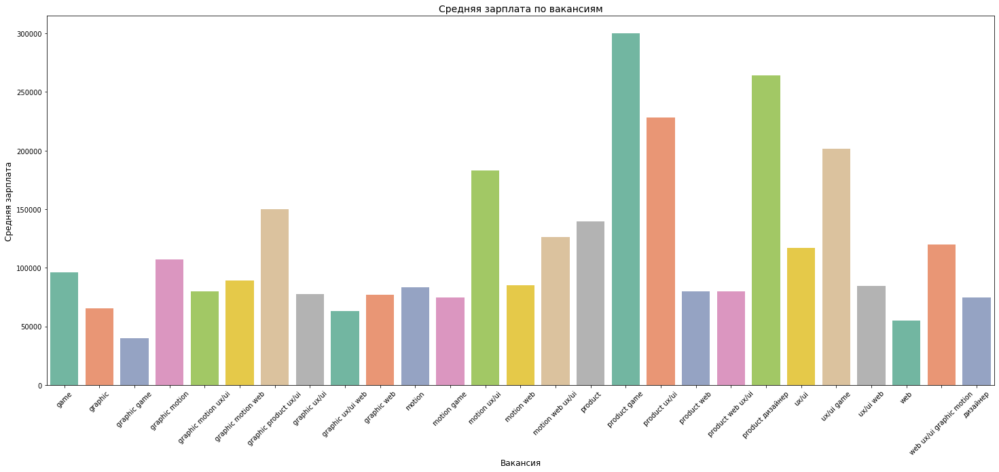

In [35]:
# Группировка данных по вакансиям и вычисление средней зарплаты
mean_salary_by_position = dataframe.groupby('standardized_name')['converted_salary'].mean().reset_index()

# Построение графика средней зарплаты по вакансиям
plt.figure(figsize=(25, 10))
sns.barplot(x='standardized_name', y='converted_salary', data=mean_salary_by_position.dropna(), palette='Set2')

# Добавление заголовка и подписей осей
plt.title('Средняя зарплата по вакансиям', fontsize=14)
plt.xlabel('Вакансия', fontsize=12)
plt.ylabel('Средняя зарплата', fontsize=12)

plt.xticks(rotation=45)  # Поворот подписей по оси X для лучшей читаемости

plt.show()

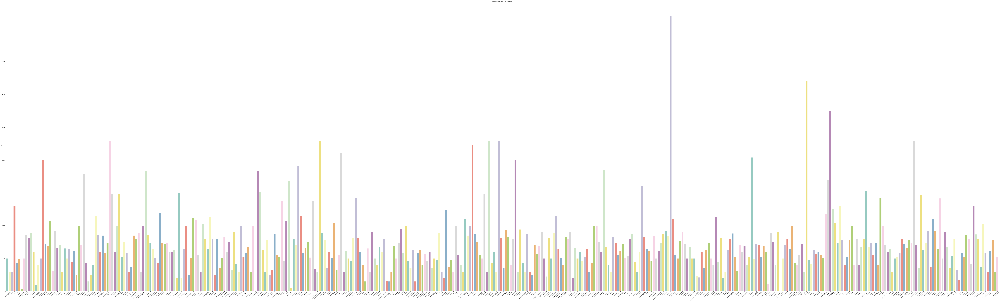

In [36]:
# Группировка данных по городам и вычисление средней зарплаты
mean_salary_by_city = dataframe.groupby('place')['converted_salary'].mean().reset_index()

# Построение графика средней зарплаты по городам
plt.figure(figsize=(200, 60))
sns.barplot(x='place', y='converted_salary', data=mean_salary_by_city.dropna(), palette='Set3')

# Добавление заголовка и подписей осей
plt.title('Средняя зарплата по городам', fontsize=14)
plt.xlabel('Город', fontsize=12)
plt.ylabel('Средняя зарплата', fontsize=12)

plt.xticks(rotation=45)  # Поворот подписей по оси X для лучшей читаемости

plt.show()

## Тип занятости

In [37]:
dataframe['employment'].unique()

array(['полная занятость, частичная занятость, проектная работа, стажировка',
       'полная занятость, частичная занятость, проектная работа',
       'полная занятость', 'full time, project work',
       'полная занятость, частичная занятость',
       'полная занятость, проектная работа, стажировка', 'full time',
       'полная занятость, проектная работа',
       'full time, part time, project work',
       'полная занятость, частичная занятость, стажировка',
       'full time, part time', 'частичная занятость, проектная работа',
       'full time, part time, project work, work placement',
       'полная занятость, стажировка',
       'полная занятость, частичная занятость, проектная работа, волонтерство, стажировка',
       'частичная занятость',
       'частичная занятость, проектная работа, стажировка',
       'полная занятость, проектная работа, волонтерство, стажировка',
       'part time, project work', 'full time, project work, volunteering',
       'full time, part time, proj

In [38]:
# Функция для нормализации названий занятости
def normalize_employment_title(title):
    # Приведение к нижнему регистру
    normalized = title.lower()
    
    # Замена специальных символов, знаков препинания и лишних пробелов
    normalized = re.sub(r'[^\w\s]', ' ', normalized)
    normalized = re.sub(r'\s+', ' ', normalized).strip()
    
    # Замена синонимов и исправление опечаток
    replacements = {
        'full time': 'полная занятость',
        'project work': 'проектная работа',
        'part time': 'частичная занятость',
        'work placement': 'стажировка',
        'volunteering': 'волонтерство',
        'жұмыспен қамтылу': 'занятость',
        'толық  жұмысбастылық': 'полная занятость',
        'жартылай жұмысбастылық': 'частичная занятость',
        'жобалық жұмыс': 'проектная работа',
        'məşğuliyyət növü': 'занятость',
        'tam məsğulluq': 'полная занятость',
        'qismən məsğulluq': 'частичная занятость',
        'layihə isi': 'проектная работа',
        'зайнятість': 'занятость',
        'повна зайнятість': 'полная занятость',
        'часткова зайнятість': 'частичная занятость',
        'проектна робота': 'проектная работа',
        'толық': 'полная',
        'жұмысбастылық': 'занятость'
    }
    
    for pattern, replacement in replacements.items():
        normalized = re.sub(pattern, replacement, normalized)
    
    return normalized

# Применяем функцию к столбцу 'employment' в датасете
dataframe['employment_normalize'] = dataframe['employment'].apply(normalize_employment_title)

In [39]:
dataframe['employment_normalize'].unique()

array(['полная занятость частичная занятость проектная работа стажировка',
       'полная занятость частичная занятость проектная работа',
       'полная занятость', 'полная занятость проектная работа',
       'полная занятость частичная занятость',
       'полная занятость проектная работа стажировка',
       'полная занятость частичная занятость стажировка',
       'частичная занятость проектная работа',
       'полная занятость стажировка',
       'полная занятость частичная занятость проектная работа волонтерство стажировка',
       'частичная занятость',
       'частичная занятость проектная работа стажировка',
       'полная занятость проектная работа волонтерство стажировка',
       'полная занятость проектная работа волонтерство', 'стажировка',
       'полная занятость частичная занятость проектная работа волонтерство',
       'частичная занятость проектная работа волонтерство стажировка',
       'частичная занятость стажировка', 'проектная работа',
       'частичная занятость 

In [540]:
keywords_employment = ['полная', 'частичная', 'проектная', 'стажировка', 'волонтерство', 'гибкий график', 'удаленная']

# Применяем функцию к столбцу 'normalized_name' в датасете
#dataframe['employment_standardized'] = dataframe['employment_normalize'].apply(lambda x: standardize_and_remove_duplicates(x, keywords_employment))



In [41]:
dataframe['employment_standardized'].unique()

array(['частичная проектная полная стажировка',
       'частичная проектная полная', 'полная', 'проектная полная',
       'частичная полная', 'проектная полная стажировка',
       'частичная полная стажировка', 'частичная проектная',
       'полная стажировка',
       'волонтерство частичная стажировка проектная полная', 'частичная',
       'частичная проектная стажировка',
       'волонтерство проектная полная стажировка',
       'волонтерство проектная полная', 'стажировка',
       'волонтерство проектная полная частичная',
       'волонтерство частичная проектная стажировка',
       'частичная стажировка', 'проектная',
       'волонтерство проектная частичная',
       'волонтерство полная стажировка',
       'волонтерство частичная полная стажировка', 'волонтерство',
       'волонтерство полная частичная', 'волонтерство частичная'],
      dtype=object)

In [42]:
dataframe['employment_standardized'].value_counts()

полная                                                4517
частичная проектная полная                            3451
частичная полная                                      1053
частичная проектная полная стажировка                  964
частичная проектная                                    551
проектная полная                                       387
частичная                                              226
частичная полная стажировка                            214
волонтерство частичная стажировка проектная полная     207
проектная                                              112
полная стажировка                                      106
частичная проектная стажировка                          84
проектная полная стажировка                             58
волонтерство проектная полная частичная                 18
частичная стажировка                                     9
волонтерство проектная частичная                         8
волонтерство частичная проектная стажировка             

In [43]:
# Посчитаем количество указанных типов занятости
dtfr = dataframe.copy()

# Функция для подсчета частоты упоминаний каждого слова
def count_words(text):
    words = text.split()  # Разбиваем текст на слова
    word_counts = Counter(words)  # Используем Counter для подсчета упоминаний каждого слова
    return word_counts

# Применение функции к столбцу с типами занятости
dtfr['word_counts'] = dtfr['employment_standardized'].apply(count_words)

# Суммирование частоты упоминаний каждого слова из всех строк
total_counts = Counter()
for counts in dtfr['word_counts']:
    total_counts += counts

# Вывод результатов
dict(total_counts)

{'частичная': 6797,
 'проектная': 5851,
 'полная': 10984,
 'стажировка': 1660,
 'волонтерство': 252}

In [44]:
dtfrm = dtfr.copy()

# Функция для подсчета частоты упоминаний каждого слова в строке
def count_words(text):
    words = text.split()  # Разбиваем текст на слова
    word_counts = Counter(words)  # Используем Counter для подсчета упоминаний каждого слова
    return word_counts

# Применение функции к столбцу с типами занятости
dtfrm['word_counts'] = dtfrm['employment_standardized'].apply(count_words)

# Список для хранения результатов подсчета
result_counts = {}

# Итерация по строкам DataFrame
for idx, row in dtfr.iterrows():
    job_title = row['standardized_name']  # Название вакансии
    word_counts = row['word_counts']  # Частота упоминаний типов занятости
    
    # Итерация по типам занятости в текущей строке
    for employment_type, count in word_counts.items():
        if employment_type not in result_counts:
            result_counts[employment_type] = Counter()
        
        # Увеличиваем счетчик для текущего типа занятости и названия вакансии
        result_counts[employment_type][job_title] += count

# Вывод результатов
for employment_type, counts_by_job in result_counts.items():
    print(f"{employment_type}:")
    for job_title, count in counts_by_job.items():
        print(f"    {job_title}: {count}")
    print()

частичная:
    game: 335
    product game: 6
    ux/ui game: 3
    дизайнер: 2718
    motion: 1327
    graphic: 911
    ux/ui web game: 1
    motion game: 5
    web game: 1
    graphic motion: 87
    ux/ui: 665
    graphic web: 41
    ux/ui web: 86
    product дизайнер: 33
    product: 4
    graphic ux/ui web: 7
    web: 462
    graphic ux/ui: 19
    product ux/ui: 60
    product web ux/ui: 2
    motion ux/ui: 3
    graphic product ux/ui: 1
    web product ux/ui graphic: 2
    motion web ux/ui: 2
    graphic motion web: 5
    motion web: 7
    web ux/ui graphic motion: 3
    product web: 1

проектная:
    game: 270
    product game: 5
    graphic: 728
    дизайнер: 2280
    motion: 1191
    ux/ui web game: 1
    motion game: 5
    web game: 1
    product: 4
    graphic motion: 82
    ux/ui: 618
    graphic web: 36
    product дизайнер: 35
    graphic ux/ui web: 7
    web: 397
    graphic ux/ui: 19
    product ux/ui: 58
    ux/ui web: 88
    ux/ui game: 1
    product web ux/ui: 2
    mo

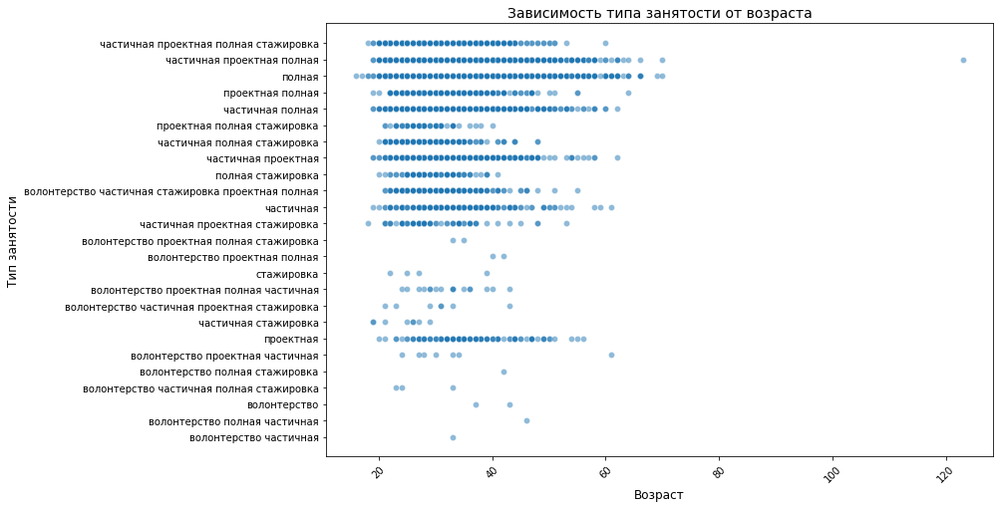

In [45]:
dtfrm['age'] = pd.to_numeric(dtfrm['age'], errors='coerce')

dtfrm = dtfrm.dropna(subset=['age'])

# Построение графика зависимости занятости от возраста с использованием seaborn
plt.figure(figsize=(12, 8))
sns.scatterplot(x='age', y='employment_standardized', data=dtfrm, alpha=0.5)
plt.title('Зависимость типа занятости от возраста', fontsize=14)
plt.xlabel('Возраст', fontsize=12)
plt.ylabel('Тип занятости', fontsize=12)
plt.xticks(rotation=45)
plt.show()

## Опыт

In [46]:
dtfr['experience'].unique()

array(['19 лет 5 месяцев', '9 месяцев', '2 года 5 месяцев',
       '10 years 8 months', '7 лет 4 месяца', '3 года 4 месяца',
       '24 года 7 месяцев', '9 лет 3 месяца', '1 год 9 месяцев',
       '11 лет 3 месяца', '14 лет 2 месяца', '6 years 6 months',
       '10 лет 9 месяцев', '8 лет 3 месяца', '26 лет', '3 years 5 months',
       '14 лет 5 месяцев', '6 years 3 months', '6 лет 9 месяцев',
       '3 года 10 месяцев', '13 years', '18 лет 6 месяцев',
       '2 года 11 месяцев', '8 лет 2 месяца', '4 года 3 месяца',
       '8 лет 6 месяцев', '4 года 8 месяцев', '2 года 8 месяцев',
       '10 лет 11 месяцев', '3 года 5 месяцев', '11 лет 8 месяцев',
       '4 года 6 месяцев', '7 лет 7 месяцев', '6 лет 2 месяца',
       '20 years 9 months', '2 года 2 месяца', '7 лет 5 месяцев',
       '11 лет', '1 год 4 месяца', '3 года 2 месяца', '5 лет 4 месяца',
       '13 years 2 months', '5 месяцев', '6 лет 7 месяцев',
       '2 года 4 месяца', '2 года 9 месяцев', '3 года 7 месяцев',
       '3 года 6 

In [47]:
# Функция для замены слов
def replace_words(text):

    text = re.sub(r'месяцев', 'месяц', text)
    text = re.sub(r'года', 'год', text)
    text = re.sub(r'лет', 'год', text)
    text = re.sub(r'years', 'год', text)
    text = re.sub(r'месяца', 'месяц', text)
    text = re.sub(r'month', 'месяц', text)
    text = re.sub(r'months', 'месяц', text)
    text = re.sub(r'year', 'год', text)
    text = re.sub(r'жыл', 'год', text)
    text = re.sub(r'айлар', 'месяц', text)
    text = re.sub(r'il', 'год', text)
    text = re.sub(r'aylar', 'месяц', text)
    text = re.sub(r'років', 'год', text)
    text = re.sub(r'місяців', 'месяц', text)
    text = re.sub(r'месяцs', 'месяц', text)
    
    return text

# Применяем функцию replace_words к столбцу 'experience'
dtfr['cleaned_experience'] = dtfr['experience'].apply(replace_words)

# Выводим результаты
dtfr[['experience', 'cleaned_experience']]

,experience,cleaned_experience
0,19 лет 5 месяцев,19 год 5 месяц
1,9 месяцев,9 месяц
2,2 года 5 месяцев,2 год 5 месяц
3,10 years 8 months,10 год 8 месяц
4,7 лет 4 месяца,7 год 4 месяц
...,...,...
11984,6 лет 11 месяцев,6 год 11 месяц
11985,13 лет 4 месяца,13 год 4 месяц
11986,8 лет 4 месяца,8 год 4 месяц
11987,11 лет 4 месяца,11 год 4 месяц


In [48]:
dtfr['cleaned_experience'].unique()

array(['19 год 5 месяц', '9 месяц', '2 год 5 месяц', '10 год 8 месяц',
       '7 год 4 месяц', '3 год 4 месяц', '24 год 7 месяц',
       '9 год 3 месяц', '1 год 9 месяц', '11 год 3 месяц',
       '14 год 2 месяц', '6 год 6 месяц', '10 год 9 месяц',
       '8 год 3 месяц', '26 год', '3 год 5 месяц', '14 год 5 месяц',
       '6 год 3 месяц', '6 год 9 месяц', '3 год 10 месяц', '13 год',
       '18 год 6 месяц', '2 год 11 месяц', '8 год 2 месяц',
       '4 год 3 месяц', '8 год 6 месяц', '4 год 8 месяц', '2 год 8 месяц',
       '10 год 11 месяц', '11 год 8 месяц', '4 год 6 месяц',
       '7 год 7 месяц', '6 год 2 месяц', '20 год 9 месяц',
       '2 год 2 месяц', '7 год 5 месяц', '11 год', '1 год 4 месяц',
       '3 год 2 месяц', '5 год 4 месяц', '13 год 2 месяц', '5 месяц',
       '6 год 7 месяц', '2 год 4 месяц', '2 год 9 месяц', '3 год 7 месяц',
       '3 год 6 месяц', '14 год 11 месяц', '12 год 11 месяц',
       '6 год 11 месяц', '7 год 9 месяц', '12 год 8 месяц',
       '19 год 1 месяц'

In [49]:
# Функция для извлечения уникальных слов из текста
def extract_unique_words(text):
    words = set(re.findall(r'\b\w+\b', text))  # Находим все слова в тексте и создаем множество уникальных слов
    return words

# Применяем функцию extract_unique_words к столбцу 'cleaned_experience' и объединяем все уникальные слова в одно множество
unique_words = set()
for text in dtfr['cleaned_experience']:
    unique_words.update(extract_unique_words(text))

# Выводим список уникальных слов
print("Уникальные слова из столбца 'cleaned_experience':")
unique_words

Уникальные слова из столбца 'cleaned_experience':


{'1',
 '10',
 '109',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '2',
 '20',
 '21',
 '22',
 '23',
 '24',
 '25',
 '26',
 '27',
 '28',
 '29',
 '3',
 '30',
 '31',
 '32',
 '33',
 '34',
 '35',
 '36',
 '37',
 '38',
 '4',
 '40',
 '44',
 '46',
 '49',
 '5',
 '6',
 '7',
 '8',
 '9',
 'təcrübəsi',
 'İş',
 'Досвід',
 'Жұмыс',
 'год',
 'месяц',
 'роботи',
 'тәжірибесі'}

In [50]:
#dm = dtfr.copy()

# Функция для очистки текста от лишних слов
def clean_text(text):
    tokens = re.findall(r'\b\d+ год|\d+ месяц\b|\d+\b', text)  # Находим нужные токены (цифры с "год" или "месяц")
    cleaned_text = ' '.join(tokens)  # Объединяем токены в строку через пробел
    return cleaned_text

# Применяем функцию clean_text к столбцу 'cleaned_experience'
dtfr['cleaned_experience'] = dtfr['cleaned_experience'].apply(clean_text)

# Выводим результаты
dtfr['cleaned_experience']

0        19 год 5 месяц
1               9 месяц
2         2 год 5 месяц
3        10 год 8 месяц
4         7 год 4 месяц
              ...      
11984    6 год 11 месяц
11985    13 год 4 месяц
11986     8 год 4 месяц
11987    11 год 4 месяц
11988    20 год 8 месяц
Name: cleaned_experience, Length: 11989, dtype: object

In [51]:
unique_words = set()
for text in dtfr['cleaned_experience']:
    unique_words.update(extract_unique_words(text))

# Выводим список уникальных слов
print("Уникальные слова из столбца 'cleaned_experience':")
unique_words

Уникальные слова из столбца 'cleaned_experience':


{'1',
 '10',
 '109',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '2',
 '20',
 '21',
 '22',
 '23',
 '24',
 '25',
 '26',
 '27',
 '28',
 '29',
 '3',
 '30',
 '31',
 '32',
 '33',
 '34',
 '35',
 '36',
 '37',
 '38',
 '4',
 '40',
 '44',
 '46',
 '49',
 '5',
 '6',
 '7',
 '8',
 '9',
 'год',
 'месяц'}

In [52]:
# dm = dtfr.copy()

# Функция для перевода опыта работы в месяцы
def calculate_total_months(text):
    total_months = 0
    
    # Используем регулярное выражение для поиска чисел, "год" и "месяц" в строке
    matches = re.findall(r'(\d+)\s*год\s*(\d*)\s*месяц|\b(\d+)\s*месяц\b|\b(\d+)\s*год\b', text)
    
    for years, months, only_months, only_years in matches:
        if years and months:
            total_months += int(years) * 12 + int(months)
        elif only_months:
            total_months += int(only_months)
        elif only_years:
            total_months += int(only_years) * 12
    
    return total_months

# Применяем функцию calculate_total_months к столбцу 'cleaned_experience'
dtfr['total_months'] = dtfr['cleaned_experience'].apply(calculate_total_months)

# Выводим результаты
print(dtfr[['cleaned_experience', 'total_months']])

      cleaned_experience  total_months
0         19 год 5 месяц           233
1                9 месяц             9
2          2 год 5 месяц            29
3         10 год 8 месяц           128
4          7 год 4 месяц            88
...                  ...           ...
11984     6 год 11 месяц            83
11985     13 год 4 месяц           160
11986      8 год 4 месяц           100
11987     11 год 4 месяц           136
11988     20 год 8 месяц           248

[11989 rows x 2 columns]


In [61]:
dtfr

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name,age_numeric,converted_salary,employment_normalize,employment_standardized,word_counts,cleaned_experience,total_months
0,Game designer,мужчина,38,казань,25000₽,"полная занятость, частичная занятость, проектн...",19 лет 5 месяцев,Высшее образование (Магистр),"[Веб-дизайн, Графические редакторы, Графически...",game дизайнер,game,38.0,25000.0,полная занятость частичная занятость проектная...,частичная проектная полная стажировка,"{'частичная': 1, 'проектная': 1, 'полная': 1, ...",19 год 5 месяц,233
1,Game Designer,мужчина,27,балашиха,,"полная занятость, частичная занятость, проектн...",9 месяцев,Среднее специальное образование,"[Ответственность, Усидчивость, Поиск информаци...",game дизайнер,game,27.0,NaN,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 месяц,9
2,Game Designer,мужчина,25,сербия,,полная занятость,2 года 5 месяцев,Неоконченное высшее образование,"[Работа в команде, Unity, Git hub, Trello, Mir...",game дизайнер,game,25.0,NaN,полная занятость,полная,{'полная': 1},2 год 5 месяц,29
3,Game designer,мужчина,31,москва,,"full time, project work",10 years 8 months,Higher education,"[Game design, Unity, Git, C#, Blender 3D]",game дизайнер,game,31.0,NaN,полная занятость проектная работа,проектная полная,"{'проектная': 1, 'полная': 1}",10 год 8 месяц,128
4,Game designer,мужчина,32,санкт петербург,1500$,полная занятость,7 лет 4 месяца,Высшее образование (Магистр),"[Английский язык, Пользователь ПК, Грамотная р...",game дизайнер,game,32.0,137445.0,полная занятость,полная,{'полная': 1},7 год 4 месяц,88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11984,Game designer,мужчина,,москва,120000₽,полная занятость,6 лет 11 месяцев,Образование,"[Cinema 4D, 3ds Max, Sony Vegas, 3D Моделирова...",game дизайнер,game,NaN,120000.0,полная занятость,полная,{'полная': 1},6 год 11 месяц,83
11985,Дизайнер-консультант,женщина,38,москва,25000₽,"частичная занятость, проектная работа",13 лет 4 месяца,Среднее специальное образование,[Консультирование клиентов],дизайнер консультант,дизайнер,38.0,25000.0,частичная занятость проектная работа,частичная проектная,"{'частичная': 1, 'проектная': 1}",13 год 4 месяц,160
11986,Графический дизайнер,женщина,,москва,,полная занятость,8 лет 4 месяца,Высшее образование,"[Adobe Lightroom, CorelDRAW, Adobe Photoshop, ...",graphic дизайнер,graphic,NaN,NaN,полная занятость,полная,{'полная': 1},8 год 4 месяц,100
11987,Web Designer / UI UX Designer,женщина,,москва,60000₽,"полная занятость, частичная занятость, проектн...",11 лет 4 месяца,Высшее образование,"[Графический дизайн, Web-дизайн, Adobe Photosh...",web дизайнер ux/ui дизайнер,ux/ui web,NaN,60000.0,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",11 год 4 месяц,136


In [69]:
filtered_df = dtfr[dtfr['age_numeric'] * 12 < dtfr['total_months']]

# Вывод отфильтрованных строк
filtered_df

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name,age_numeric,converted_salary,employment_normalize,employment_standardized,word_counts,cleaned_experience,total_months
105,Game Designer / Analyst,мужчина,33,ростов на дону,,полная занятость,33 года 9 месяцев,Высшее образование,"[B2B Продажи, HTML, MS Word, Веб-аналитика, Ма...",game дизайнер analyst,game,33.0,NaN,полная занятость,полная,{'полная': 1},33 год 9 месяц,405
7502,Motion Disagn (подселяю 3D персонажей в ваше в...,мужчина,42,инзер,5000₽,полная занятость,109 лет 5 месяцев,Образование,"[AE, Cinema4D, Video Compositing]",motion disagn подселяю 3d персонажей в ваше видео,motion,42.0,5000.0,полная занятость,полная,{'полная': 1},109 год 5 месяц,1313
10521,Дизайнер,мужчина,29,москва,,"частичная занятость, проектная работа",29 лет 11 месяцев,Высшее образование,"[Adobe Photoshop, Графический дизайн, Дизайн, ...",дизайнер,дизайнер,29.0,NaN,частичная занятость проектная работа,частичная проектная,"{'частичная': 1, 'проектная': 1}",29 год 11 месяц,359


In [70]:
dtfr.drop(filtered_df.index, inplace=True)

# Сброс индекса после удаления
dtfr.reset_index(drop=True, inplace=True)
dtfr

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name,age_numeric,converted_salary,employment_normalize,employment_standardized,word_counts,cleaned_experience,total_months
0,Game designer,мужчина,38,казань,25000₽,"полная занятость, частичная занятость, проектн...",19 лет 5 месяцев,Высшее образование (Магистр),"[Веб-дизайн, Графические редакторы, Графически...",game дизайнер,game,38.0,25000.0,полная занятость частичная занятость проектная...,частичная проектная полная стажировка,"{'частичная': 1, 'проектная': 1, 'полная': 1, ...",19 год 5 месяц,233
1,Game Designer,мужчина,27,балашиха,,"полная занятость, частичная занятость, проектн...",9 месяцев,Среднее специальное образование,"[Ответственность, Усидчивость, Поиск информаци...",game дизайнер,game,27.0,NaN,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 месяц,9
2,Game Designer,мужчина,25,сербия,,полная занятость,2 года 5 месяцев,Неоконченное высшее образование,"[Работа в команде, Unity, Git hub, Trello, Mir...",game дизайнер,game,25.0,NaN,полная занятость,полная,{'полная': 1},2 год 5 месяц,29
3,Game designer,мужчина,31,москва,,"full time, project work",10 years 8 months,Higher education,"[Game design, Unity, Git, C#, Blender 3D]",game дизайнер,game,31.0,NaN,полная занятость проектная работа,проектная полная,"{'проектная': 1, 'полная': 1}",10 год 8 месяц,128
4,Game designer,мужчина,32,санкт петербург,1500$,полная занятость,7 лет 4 месяца,Высшее образование (Магистр),"[Английский язык, Пользователь ПК, Грамотная р...",game дизайнер,game,32.0,137445.0,полная занятость,полная,{'полная': 1},7 год 4 месяц,88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11981,Game designer,мужчина,,москва,120000₽,полная занятость,6 лет 11 месяцев,Образование,"[Cinema 4D, 3ds Max, Sony Vegas, 3D Моделирова...",game дизайнер,game,NaN,120000.0,полная занятость,полная,{'полная': 1},6 год 11 месяц,83
11982,Дизайнер-консультант,женщина,38,москва,25000₽,"частичная занятость, проектная работа",13 лет 4 месяца,Среднее специальное образование,[Консультирование клиентов],дизайнер консультант,дизайнер,38.0,25000.0,частичная занятость проектная работа,частичная проектная,"{'частичная': 1, 'проектная': 1}",13 год 4 месяц,160
11983,Графический дизайнер,женщина,,москва,,полная занятость,8 лет 4 месяца,Высшее образование,"[Adobe Lightroom, CorelDRAW, Adobe Photoshop, ...",graphic дизайнер,graphic,NaN,NaN,полная занятость,полная,{'полная': 1},8 год 4 месяц,100
11984,Web Designer / UI UX Designer,женщина,,москва,60000₽,"полная занятость, частичная занятость, проектн...",11 лет 4 месяца,Высшее образование,"[Графический дизайн, Web-дизайн, Adobe Photosh...",web дизайнер ux/ui дизайнер,ux/ui web,NaN,60000.0,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",11 год 4 месяц,136


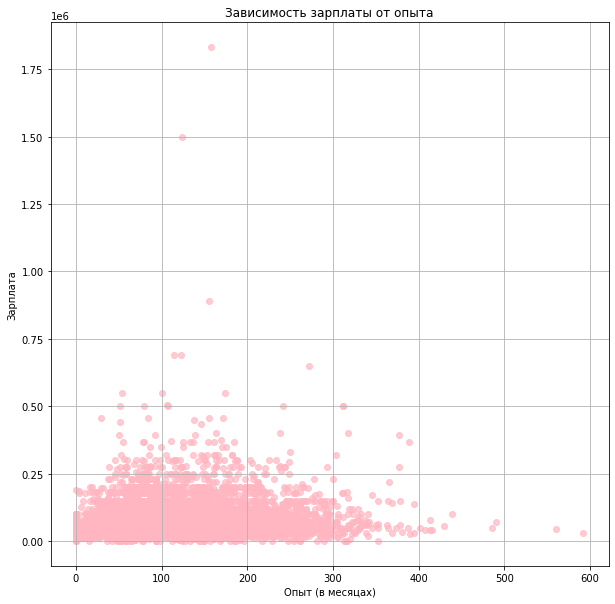

In [153]:
# Строим график зависимости опыта от зарплаты
plt.figure(figsize=(10, 10))
plt.scatter(dtfr['total_months'], dtfr['converted_salary'], color='lightpink', alpha=0.7)
plt.title('Зависимость зарплаты от опыта')
plt.xlabel('Опыт (в месяцах)')
plt.ylabel('Зарплата')
plt.grid(True)
plt.show()

In [72]:
# Находим индекс строки с наибольшей зарплатой
max_salary_index = dtfr['converted_salary'].idxmax()
# Находим индекс строки с наименьшей зарплатой
min_salary_index = dtfr['converted_salary'].idxmin()

# Выводим строку с наибольшей зарплатой
print("Резюме с наибольшей зарплатой:")
print(dtfr.loc[max_salary_index])

# Выводим строку с наименьшей зарплатой
print("\nРезюме с наименьшей зарплатой:")
print(dtfr.loc[min_salary_index])

Резюме с наибольшей зарплатой:
name                              Художник - иллюстратор и концепт художник.
gender                                                               мужчина
age                                                                         
place                                                              чебоксары
salary                                                               20000$ 
employment                 полная занятость, частичная занятость, проектн...
experience                                                   13 лет 2 месяца
education                                    Среднее специальное образование
tags                                                      [Ведущий дизайнер]
normalized_name                      дизайнер иллюстратор и концепт дизайнер
standardized_name                                                   дизайнер
age_numeric                                                              NaN
converted_salary                             

In [107]:
# Рассмотрим гепотизу о том, что люди с большим опытом переезжают в москву

In [76]:
filtered_df = dtfr[dtfr['total_months'].notna() & dtfr['age_numeric'].isna()]

# Вывод отфильтрованных строк
filtered_df

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name,age_numeric,converted_salary,employment_normalize,employment_standardized,word_counts,cleaned_experience,total_months
16,Game Producer / Product Owner / Lead Game Desi...,мужчина,,санкт петербург,,"полная занятость, частичная занятость, проектн...",14 лет 5 месяцев,Высшее образование,"[Разработка концепции, Разработка технических ...",game producer product owner lead game дизайнер,product game,NaN,NaN,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",14 год 5 месяц,173
17,Game Designer,мужчина,,армения,,"full time, part time, project work",6 years 3 months,Higher education (bachelor),"[Ответственность, Time management, Desire to l...",game дизайнер,game,NaN,NaN,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",6 год 3 месяц,75
111,Game design,мужчина,,воронеж,50000₽,"частичная занятость, проектная работа",14 лет 9 месяцев,Высшее образование,"[Adobe After Effect, Blender 3D, HTML5, intera...",game дизайнер,game,NaN,50000.0,частичная занятость проектная работа,частичная проектная,"{'частичная': 1, 'проектная': 1}",14 год 9 месяц,177
235,Графический дизайнер,мужчина,,краснодар,,"full time, part time, project work",11 years 10 months,Higher education,"[Работа в команде, Креативность, Ориентация на...",graphic дизайнер,graphic,NaN,NaN,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",11 год 10 месяц,142
241,Narrative designer/Game designer,мужчина,,краснодар,50000₽,"полная занятость, частичная занятость, стажировка",5 лет 8 месяцев,Среднее специальное образование,"[Исполнительность, Креативность, Грамотная реч...",narrative дизайнер game дизайнер,game,NaN,50000.0,полная занятость частичная занятость стажировка,частичная полная стажировка,"{'частичная': 1, 'полная': 1, 'стажировка': 1}",5 год 8 месяц,68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11978,Коммуникативный дизайнер,мужчина,,москва,,"полная занятость, проектная работа",7 лет,Высшее образование,[Трудолюбие.],коммуникативный дизайнер,дизайнер,NaN,NaN,полная занятость проектная работа,проектная полная,"{'проектная': 1, 'полная': 1}",7 год,84
11980,Motion designer,мужчина,,москва,150000₽,полная занятость,9 лет 9 месяцев,Высшее образование,"[3D Моделирование, Cinema 4D, Adobe After Effe...",motion дизайнер,motion,NaN,150000.0,полная занятость,полная,{'полная': 1},9 год 9 месяц,117
11981,Game designer,мужчина,,москва,120000₽,полная занятость,6 лет 11 месяцев,Образование,"[Cinema 4D, 3ds Max, Sony Vegas, 3D Моделирова...",game дизайнер,game,NaN,120000.0,полная занятость,полная,{'полная': 1},6 год 11 месяц,83
11983,Графический дизайнер,женщина,,москва,,полная занятость,8 лет 4 месяца,Высшее образование,"[Adobe Lightroom, CorelDRAW, Adobe Photoshop, ...",graphic дизайнер,graphic,NaN,NaN,полная занятость,полная,{'полная': 1},8 год 4 месяц,100


In [140]:
df_cleaned = dtfr.dropna(subset=['age_numeric'])
df_cleaned.reset_index(drop=True, inplace=True)
df_cleaned

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name,age_numeric,converted_salary,employment_normalize,employment_standardized,word_counts,cleaned_experience,total_months
0,Game designer,мужчина,38,казань,25000₽,"полная занятость, частичная занятость, проектн...",19 лет 5 месяцев,Высшее образование (Магистр),"[Веб-дизайн, Графические редакторы, Графически...",game дизайнер,game,38.0,25000.0,полная занятость частичная занятость проектная...,частичная проектная полная стажировка,"{'частичная': 1, 'проектная': 1, 'полная': 1, ...",19 год 5 месяц,233
1,Game Designer,мужчина,27,балашиха,,"полная занятость, частичная занятость, проектн...",9 месяцев,Среднее специальное образование,"[Ответственность, Усидчивость, Поиск информаци...",game дизайнер,game,27.0,NaN,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 месяц,9
2,Game Designer,мужчина,25,сербия,,полная занятость,2 года 5 месяцев,Неоконченное высшее образование,"[Работа в команде, Unity, Git hub, Trello, Mir...",game дизайнер,game,25.0,NaN,полная занятость,полная,{'полная': 1},2 год 5 месяц,29
3,Game designer,мужчина,31,москва,,"full time, project work",10 years 8 months,Higher education,"[Game design, Unity, Git, C#, Blender 3D]",game дизайнер,game,31.0,NaN,полная занятость проектная работа,проектная полная,"{'проектная': 1, 'полная': 1}",10 год 8 месяц,128
4,Game designer,мужчина,32,санкт петербург,1500$,полная занятость,7 лет 4 месяца,Высшее образование (Магистр),"[Английский язык, Пользователь ПК, Грамотная р...",game дизайнер,game,32.0,137445.0,полная занятость,полная,{'полная': 1},7 год 4 месяц,88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10842,Jewelry Designer,женщина,29,москва,40000₽,"полная занятость, частичная занятость, проектн...",9 лет 7 месяцев,Высшее образование (Бакалавр),"[Пользователь ПК, Adobe Photoshop, Английский ...",jewelry дизайнер,дизайнер,29.0,40000.0,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 год 7 месяц,115
10843,Motion Designer,мужчина,35,москва,320000₽,полная занятость,13 лет 5 месяцев,Неоконченное высшее образование,"[Видеомонтаж, Adobe After Effect, Cinema 4D, Г...",motion дизайнер,motion,35.0,320000.0,полная занятость,полная,{'полная': 1},13 год 5 месяц,161
10844,Дизайнер,мужчина,35,москва,50000₽,полная занятость,5 лет 8 месяцев,Среднее специальное образование,"[Adobe Photoshop, Веб-дизайн, Графический диза...",дизайнер,дизайнер,35.0,50000.0,полная занятость,полная,{'полная': 1},5 год 8 месяц,68
10845,Дизайнер-консультант,женщина,38,москва,25000₽,"частичная занятость, проектная работа",13 лет 4 месяца,Среднее специальное образование,[Консультирование клиентов],дизайнер консультант,дизайнер,38.0,25000.0,частичная занятость проектная работа,частичная проектная,"{'частичная': 1, 'проектная': 1}",13 год 4 месяц,160


In [83]:
# Группируем данные по месту работы (place) и среднему опыту (total_months)
grouped = df_cleaned.groupby('place')['total_months'].mean().reset_index()

num_places = len(grouped['place'])
colors = cm.get_cmap('tab20', num_places)

# Строим график
plt.figure(figsize=(200, 60))
plt.bar(grouped['place'], grouped['total_months'], color=colors(np.arange(num_places)))
plt.xlabel('Место работы')
plt.ylabel('Средний опыт (в месяцах)')
plt.title('Зависимость опыта от места работы')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

<ipython-input-83-51a40857abc4>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', num_places)


In [141]:
# Находим индекс строки с наибольшим опытом
max_expirience_index = df_cleaned['total_months'].idxmax()
# Находим индекс строки с наименьшим опытом
min_expirience_index = df_cleaned['total_months'].idxmin()

print("Резюме с наибольшим опытом:")
print(df_cleaned.loc[max_expirience_index])

print("\nРезюме с наименьшим опытом:")
print(df_cleaned.loc[min_expirience_index])

Резюме с наибольшим опытом:
name                                                                Дизайнер
gender                                                               мужчина
age                                                                       70
place                                                                 москва
salary                                                               45000₽ 
employment                                                  полная занятость
experience                                                  46 лет 8 месяцев
education                                                 Высшее образование
tags                       [Русский — Родной, Английский — B2 — Средне-пр...
normalized_name                                                     дизайнер
standardized_name                                                   дизайнер
age_numeric                                                             70.0
converted_salary                                

## Образование

In [142]:
df_cleaned['education'].unique()

array(['Высшее образование (Магистр)', 'Среднее специальное образование',
       'Неоконченное высшее образование', 'Higher education',
       'Высшее образование', 'Образование', 'Higher education (master)',
       'Higher education (bachelor)', 'Высшее образование (Бакалавр)',
       'Incomplete higher education', 'Среднее образование',
       'Higher education (PhD)', 'Secondary special education',
       'Высшее образование (Кандидат наук)', 'Secondary education',
       'Education', 'Жоғары білімі', 'Высшее образование (Доктор наук)',
       'Ali təhsil', 'Ali təhsil (Bakalavr)', 'Natamam ali təhsil',
       'Середня спеціальна освіта'], dtype=object)

In [143]:
# Функция для нормализации названий образования
def normalize_education_title(title):
    # Приведение к нижнему регистру
    normalized = title.lower()
    
    # Замена специальных символов, знаков препинания и лишних пробелов
    normalized = re.sub(r'[^\w\s]', ' ', normalized)
    normalized = re.sub(r'\s+', ' ', normalized).strip()
    
    # Замена синонимов и исправление опечаток
    replacements = {
        'higher education': 'высшее образование',
        'master': 'магистр',
        'bachelor': 'бакалавр',
        'incomplete': 'неполное',
        'неоконченное': 'неполное',
        'phd': 'кандидат наук',
        'secondary special education': 'среднее специальное образование',
        'secondary education': 'среднее образование',
        'education': 'образование',
        'жоғары білімі': 'высшее образование',
        'ali təhsil': 'высшее образование',
        'bakalavr': 'бакалавр',
        'natamam': 'неполное',
        'середня спеціальна освіта': 'среднее специальное образование'
    }
    
    for pattern, replacement in replacements.items():
        normalized = re.sub(pattern, replacement, normalized)
    
    return normalized

# Применяем функцию к столбцу 'employment' в датасете
df_cleaned['education'] = df_cleaned['education'].apply(normalize_education_title)

<ipython-input-143-f543b9abb608>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['education'] = df_cleaned['education'].apply(normalize_education_title)


In [144]:
df_cleaned['education'].unique()

array(['высшее образование магистр', 'среднее специальное образование',
       'неполное высшее образование', 'высшее образование', 'образование',
       'высшее образование бакалавр', 'среднее образование',
       'высшее образование кандидат наук',
       'высшее образование доктор наук'], dtype=object)

In [145]:
df_cleaned['education'].value_counts()

высшее образование                  5534
среднее специальное образование     1520
неполное высшее образование         1305
высшее образование бакалавр         1167
образование                          577
высшее образование магистр           492
среднее образование                  231
высшее образование кандидат наук      19
высшее образование доктор наук         2
Name: education, dtype: int64

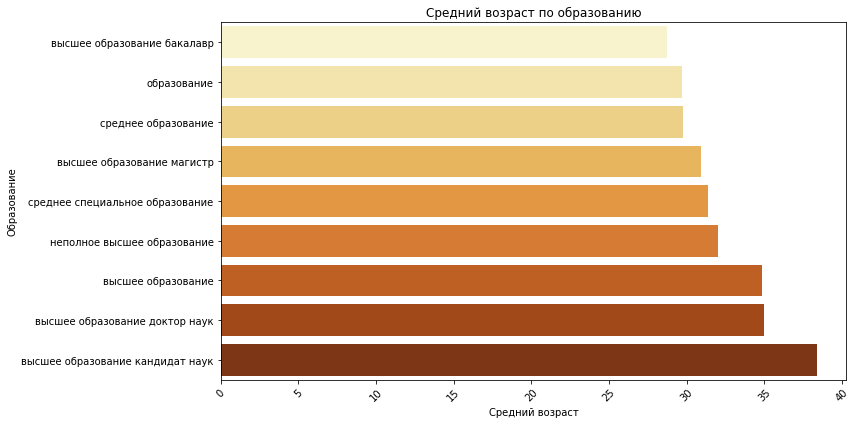

In [130]:
# Создаем фигуру и оси графика
plt.figure(figsize=(12, 6))

# Группируем данные по образованию и вычисляем средний возраст
education_age_mean = df_cleaned.groupby('education')['age_numeric'].mean().sort_values()

# Строим горизонтальный бар-график
sns.barplot(x=education_age_mean.values, y=education_age_mean.index, palette='YlOrBr')
# Настройка заголовка и меток осей
plt.title('Средний возраст по образованию')
plt.xlabel('Средний возраст')
plt.ylabel('Образование')

# Поворачиваем метки по оси X для лучшей читаемости
plt.xticks(rotation=45)

# Отображаем график
plt.tight_layout()
plt.show()

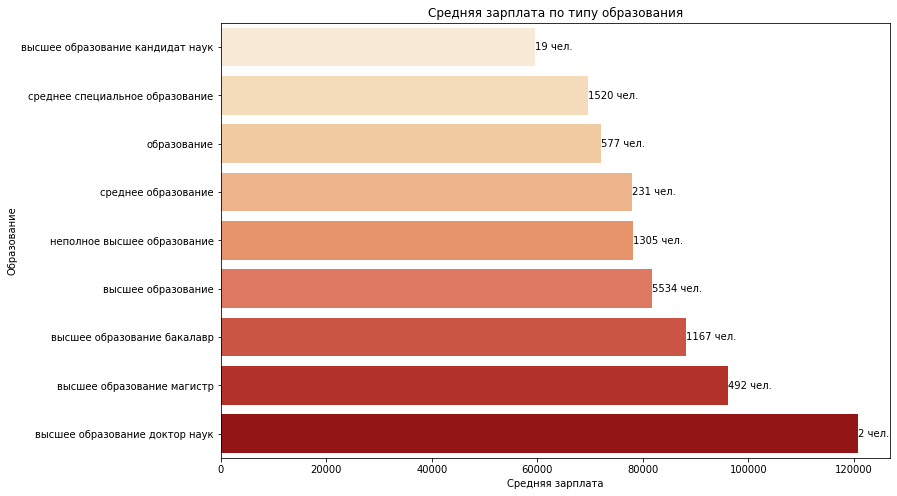

In [183]:
# Группировка данных по образованию и вычисление средней зарплаты
mean_salary_by_education = df_cleaned.groupby('education')['converted_salary'].mean().sort_values()

# Подсчет количества людей с каждым типом образования
education_counts = df_cleaned['education'].value_counts()

# Построение графика средней зарплаты по типу образования
plt.figure(figsize=(12, 8))
sns.barplot(x=mean_salary_by_education.values, y=mean_salary_by_education.index, palette='OrRd')  
plt.xlabel('Средняя зарплата')
plt.ylabel('Образование')
plt.title('Средняя зарплата по типу образования')

# Добавление текстовых меток с количеством людей над столбцами
for i, v in enumerate(mean_salary_by_education.values):
    plt.text(v + 1, i, f'{education_counts[mean_salary_by_education.index[i]]} чел.', color='black', va='center')

plt.show()

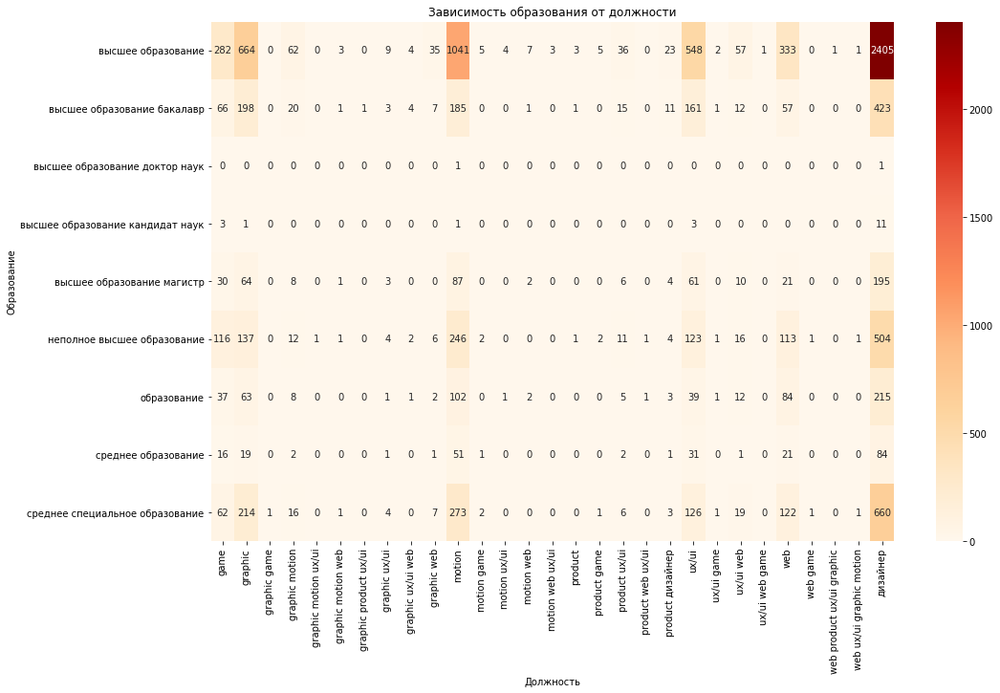

In [132]:
# Группировка данных по образованию и должности и подсчет числа записей
education_job_counts = df_cleaned.groupby(['education', 'standardized_name'])['standardized_name'].count().unstack().fillna(0)

# Построение графика
plt.figure(figsize=(16, 10))
sns.heatmap(education_job_counts, cmap='OrRd', annot=True, fmt='g')
plt.xlabel('Должность')
plt.ylabel('Образование')
plt.title('Зависимость образования от должности')
plt.show()

In [1169]:
df_tags

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,...,age_numeric,converted_salary,employment_normalize,employment_standardized,word_counts,cleaned_experience,total_months,processed_tags,processed_tags_str,tags_count
0,Game designer,мужчина,38,казань,25000₽,"полная занятость, частичная занятость, проектн...",19 лет 5 месяцев,высшее образование магистр,"[Веб-дизайн, Графические редакторы, Графически...",game дизайнер,...,38.0,25000.0,полная занятость частичная занятость проектная...,частичная проектная полная стажировка,"{'частичная': 1, 'проектная': 1, 'полная': 1, ...",19 год 5 месяц,233,"[вебдизайн, графический, редактор, графический...",вебдизайн графический редактор графический диз...,54
1,Game Designer,мужчина,27,балашиха,,"полная занятость, частичная занятость, проектн...",9 месяцев,среднее специальное образование,"[Ответственность, Усидчивость, Поиск информаци...",game дизайнер,...,27.0,NaN,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 месяц,9,"[ответственность, усидчивость, поиск, информац...",ответственность усидчивость поиск информация и...,22
2,Game Designer,мужчина,25,сербия,,полная занятость,2 года 5 месяцев,неполное высшее образование,"[Работа в команде, Unity, Git hub, Trello, Mir...",game дизайнер,...,25.0,NaN,полная занятость,полная,{'полная': 1},2 год 5 месяц,29,"[работа, команда, unity, git, hub, trello, mir...",работа команда unity git hub trello miro googl...,12
3,Game designer,мужчина,31,москва,,"full time, project work",10 years 8 months,высшее образование,"[Game design, Unity, Git, C#, Blender 3D]",game дизайнер,...,31.0,NaN,полная занятость проектная работа,проектная полная,"{'проектная': 1, 'полная': 1}",10 год 8 месяц,128,"[game, design, unity, git, c, blender]",game design unity git c blender,6
4,Game designer,мужчина,32,санкт петербург,1500$,полная занятость,7 лет 4 месяца,высшее образование магистр,"[Английский язык, Пользователь ПК, Грамотная р...",game дизайнер,...,32.0,137445.0,полная занятость,полная,{'полная': 1},7 год 4 месяц,88,"[английский, язык, пользователь, пк, грамотный...",английский язык пользователь пк грамотный речь...,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10842,Jewelry Designer,женщина,29,москва,40000₽,"полная занятость, частичная занятость, проектн...",9 лет 7 месяцев,высшее образование бакалавр,"[Пользователь ПК, Adobe Photoshop, Английский ...",jewelry дизайнер,...,29.0,40000.0,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 год 7 месяц,115,"[пользователь, пк, adobe, photoshop, английски...",пользователь пк adobe photoshop английский язы...,12
10843,Motion Designer,мужчина,35,москва,320000₽,полная занятость,13 лет 5 месяцев,неполное высшее образование,"[Видеомонтаж, Adobe After Effect, Cinema 4D, Г...",motion дизайнер,...,35.0,320000.0,полная занятость,полная,{'полная': 1},13 год 5 месяц,161,"[видеомонтаж, adobe, effect, cinema, графическ...",видеомонтаж adobe effect cinema графический ди...,15
10844,Дизайнер,мужчина,35,москва,50000₽,полная занятость,5 лет 8 месяцев,среднее специальное образование,"[Adobe Photoshop, Веб-дизайн, Графический диза...",дизайнер,...,35.0,50000.0,полная занятость,полная,{'полная': 1},5 год 8 месяц,68,"[adobe, photoshop, вебдизайн, графический, диз...",adobe photoshop вебдизайн графический дизайн г...,26
10845,Дизайнер-консультант,женщина,38,москва,25000₽,"частичная занятость, проектная работа",13 лет 4 месяца,среднее специальное образование,[Консультирование клиентов],дизайнер консультант,...,38.0,25000.0,частичная занятость проектная работа,частичная проектная,"{'частичная': 1, 'проектная': 1}",13 год 4 месяц,160,"[консультирование, клиент]",консультирование клиент,2


In [1170]:
# Оставляем только нужные столбцы
selected_columns = ['standardized_name', 'gender', 'age_numeric', 'place', 'converted_salary', 'employment_normalize', 'cleaned_experience', 'education', 'processed_tags_str']
datadet_clean_resume = df_tags[selected_columns]
datadet_clean_resume

,standardized_name,gender,age_numeric,place,converted_salary,employment_normalize,cleaned_experience,education,processed_tags_str
0,0,мужчина,38.0,казань,25000.0,полная занятость частичная занятость проектная...,19 год 5 месяц,высшее образование магистр,вебдизайн графический редактор графический диз...
1,0,мужчина,27.0,балашиха,NaN,полная занятость частичная занятость проектная...,9 месяц,среднее специальное образование,ответственность усидчивость поиск информация и...
2,0,мужчина,25.0,сербия,NaN,полная занятость,2 год 5 месяц,неполное высшее образование,работа команда unity git hub trello miro googl...
3,0,мужчина,31.0,москва,NaN,полная занятость проектная работа,10 год 8 месяц,высшее образование,game design unity git c blender
4,0,мужчина,32.0,санкт петербург,137445.0,полная занятость,7 год 4 месяц,высшее образование магистр,английский язык пользователь пк грамотный речь...
...,...,...,...,...,...,...,...,...,...
10842,28,женщина,29.0,москва,40000.0,полная занятость частичная занятость проектная...,9 год 7 месяц,высшее образование бакалавр,пользователь пк adobe photoshop английский язы...
10843,10,мужчина,35.0,москва,320000.0,полная занятость,13 год 5 месяц,неполное высшее образование,видеомонтаж adobe effect cinema графический ди...
10844,28,мужчина,35.0,москва,50000.0,полная занятость,5 год 8 месяц,среднее специальное образование,adobe photoshop вебдизайн графический дизайн г...
10845,28,женщина,38.0,москва,25000.0,частичная занятость проектная работа,13 год 4 месяц,среднее специальное образование,консультирование клиент


## Навыки

In [203]:
df_tags = df_cleaned.copy()

In [1090]:
def process_text(text):
    # Приведение списка тегов к строке
    text = ', '.join(text)
    print(f"Исходный текст: {text}")
    
    # Приведение текста к нижнему регистру и удаление знаков препинания
    cleaned_text = re.sub(r'[^\w\s,]', '', text.lower())
    print(f"Очищенный текст: {cleaned_text}")
    
    # Токенизация текста
    tokens = word_tokenize(cleaned_text)
    print(f"Токены: {tokens}")
    
    # Фильтрация стоп-слов для русского и английского языков
    filtered_tokens = [word for word in tokens if word not in stop_words_ru and word not in stop_words_en]
    print(f"Фильтрованные токены: {filtered_tokens}")
    
    # Объединение фильтрованных токенов в строку
    filtered_text = ' '.join(filtered_tokens)
    print(f"Фильтрованный текст: {filtered_text}")
    
    # Создание объекта Mystem для лемматизации русских слов
    mystem = Mystem()
    
    # Лемматизация текста
    lemmas = mystem.lemmatize(filtered_text)
    print(f"Леммы: {lemmas}")
    
    # Фильтрация и сохранение только буквенных лемм
    lemmatized_tokens = [lemma for lemma in lemmas if lemma.isalpha()]
    print(f"Лемматизированные токены: {lemmatized_tokens}")
    
    return lemmatized_tokens

# Применение функции обработки текста к столбцу 'tags'
df_tags['processed_tags'] = df_tags['tags'].apply(process_text)

# Подсчет статистики встречаемости слов
all_words = [word for tags in df_tags['processed_tags'] for word in tags]
word_counts = Counter(all_words)

# # Вывод результата подсчета статистики
# print("Статистика встречаемости слов:")
# print(word_counts)

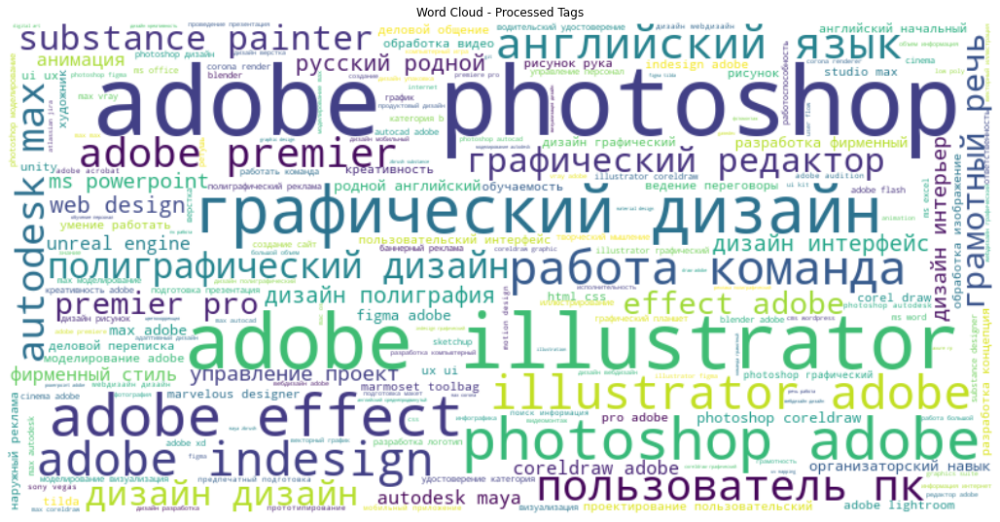

In [182]:
# Собираем все слова из списков processed_tags в один список
all_words = []
for tags_list in df_tags['processed_tags']:
    all_words.extend(tags_list)

# Создаем строку, объединяя все слова через пробел
all_processed_tags = ' '.join(all_words)

# Создаем объект WordCloud и генерируем облако слов
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_processed_tags)

# Отображаем облако слов
plt.figure(figsize=(40, 40))
plt.subplot(1, 2, 2)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud - Processed Tags')
plt.axis('off')  # Убираем оси координат
plt.show()

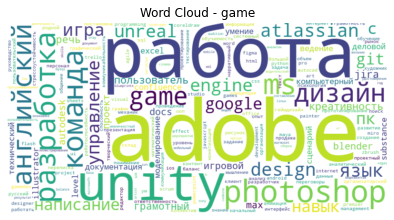

Top keywords for game:
adobe: 412
работа: 278
unity: 266
photoshop: 242
команда: 215




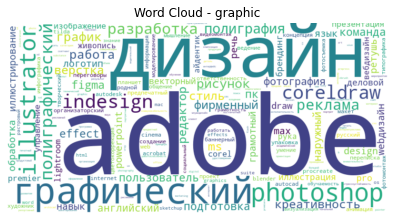

Top keywords for graphic:
adobe: 3500
дизайн: 2400
графический: 1245
photoshop: 1150
illustrator: 974




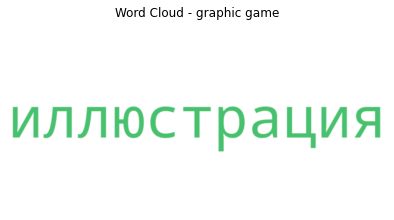

Top keywords for graphic game:
иллюстрация: 1




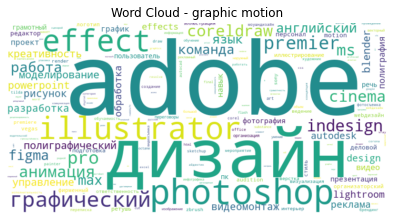

Top keywords for graphic motion:
adobe: 465
дизайн: 160
photoshop: 109
illustrator: 93
effect: 88




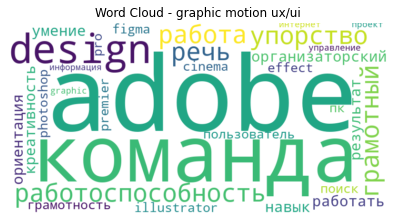

Top keywords for graphic motion ux/ui:
adobe: 4
команда: 2
design: 2
работоспособность: 1
упорство: 1




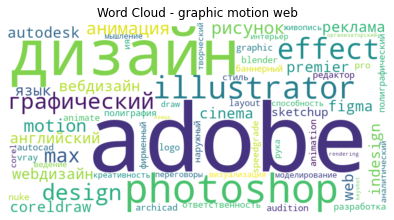

Top keywords for graphic motion web:
adobe: 25
дизайн: 9
photoshop: 7
illustrator: 6
effect: 5




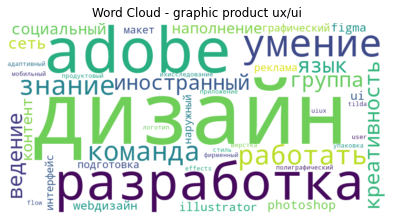

Top keywords for graphic product ux/ui:
дизайн: 7
adobe: 3
разработка: 2
умение: 1
работать: 1




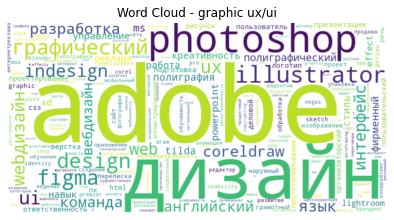

Top keywords for graphic ux/ui:
adobe: 88
дизайн: 52
photoshop: 28
illustrator: 27
графический: 21




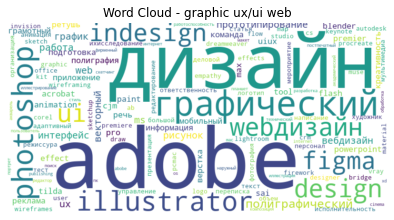

Top keywords for graphic ux/ui web:
adobe: 34
дизайн: 27
графический: 12
photoshop: 8
illustrator: 7




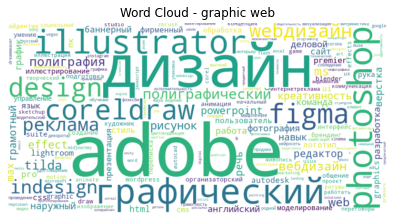

Top keywords for graphic web:
adobe: 167
дизайн: 108
графический: 52
photoshop: 49
illustrator: 48




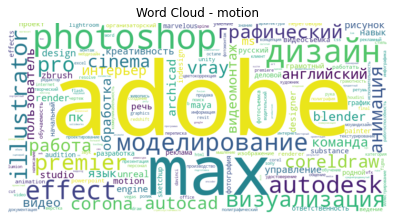

Top keywords for motion:
adobe: 3976
max: 1423
photoshop: 1415
дизайн: 1236
effect: 757




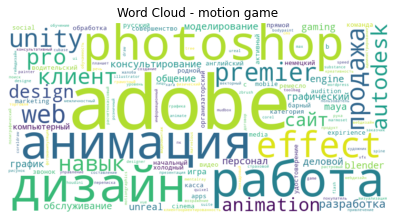

Top keywords for motion game:
adobe: 17
работа: 5
photoshop: 5
анимация: 5
дизайн: 5




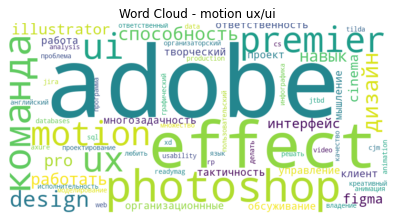

Top keywords for motion ux/ui:
adobe: 14
effect: 4
photoshop: 4
команда: 3
premier: 3




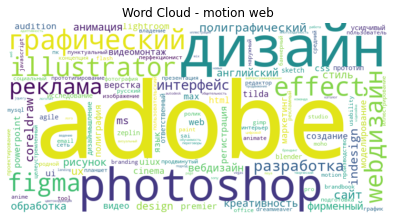

Top keywords for motion web:
adobe: 39
дизайн: 17
photoshop: 10
графический: 8
illustrator: 8




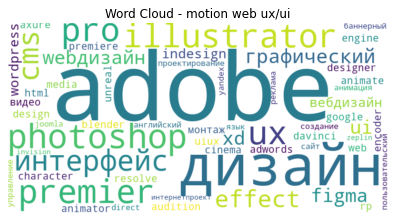

Top keywords for motion web ux/ui:
adobe: 20
дизайн: 4
photoshop: 3
illustrator: 3
premier: 3




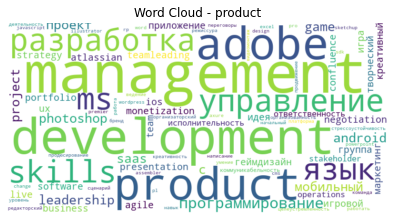

Top keywords for product:
management: 7
development: 5
product: 4
adobe: 4
разработка: 3




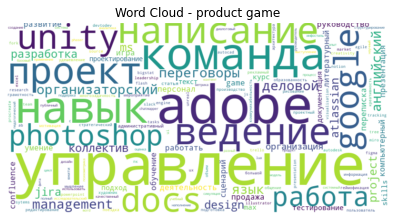

Top keywords for product game:
управление: 9
adobe: 7
команда: 5
навык: 5
проект: 5




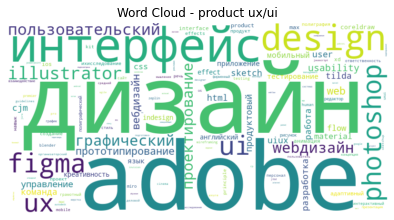

Top keywords for product ux/ui:
дизайн: 175
adobe: 171
интерфейс: 85
design: 83
figma: 66




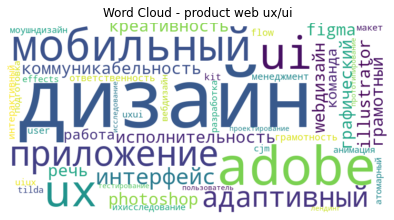

Top keywords for product web ux/ui:
дизайн: 10
adobe: 3
ui: 2
ux: 2
мобильный: 2




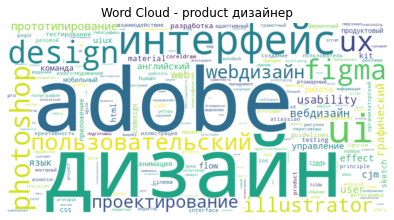

Top keywords for product дизайнер:
adobe: 102
дизайн: 91
интерфейс: 52
ui: 47
design: 45




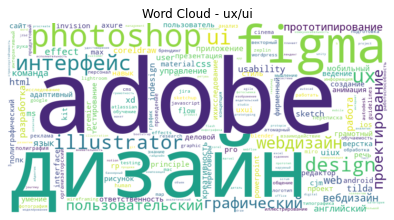

Top keywords for ux/ui:
adobe: 2389
дизайн: 1552
figma: 883
photoshop: 880
интерфейс: 822




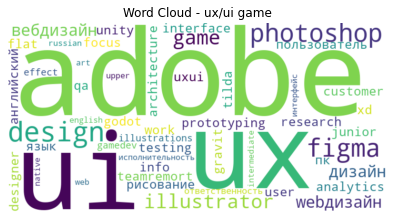

Top keywords for ux/ui game:
adobe: 9
ux: 7
ui: 7
design: 6
figma: 5




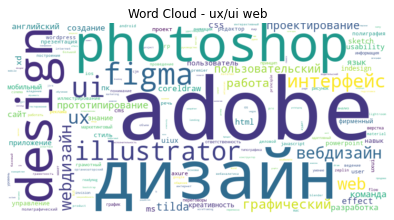

Top keywords for ux/ui web:
adobe: 286
дизайн: 164
photoshop: 110
design: 106
figma: 95




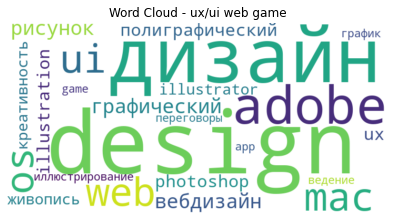

Top keywords for ux/ui web game:
design: 4
дизайн: 3
adobe: 2
ui: 1
web: 1




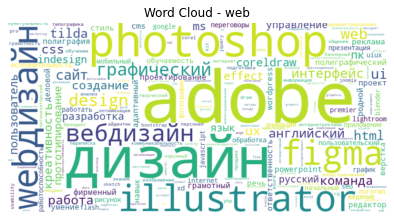

Top keywords for web:
adobe: 1242
дизайн: 736
photoshop: 545
illustrator: 341
webдизайн: 308




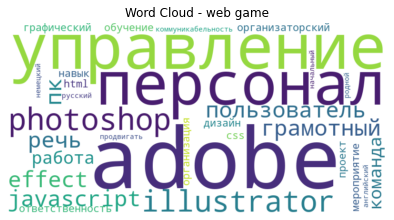

Top keywords for web game:
adobe: 3
управление: 2
персонал: 2
photoshop: 1
illustrator: 1




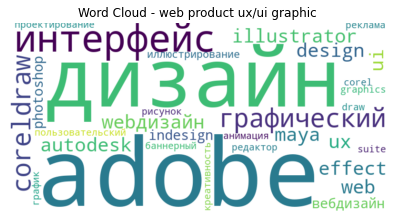

Top keywords for web product ux/ui graphic:
adobe: 4
дизайн: 3
интерфейс: 2
графический: 2
coreldraw: 2




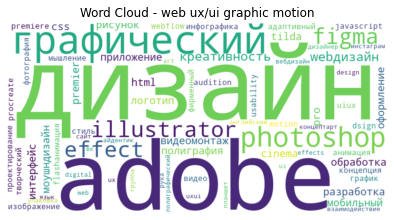

Top keywords for web ux/ui graphic motion:
дизайн: 16
adobe: 14
графический: 4
photoshop: 4
illustrator: 3




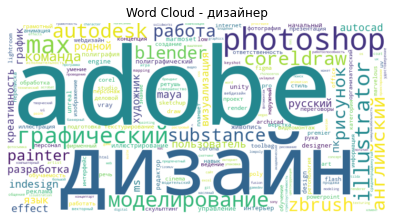

Top keywords for дизайнер:
adobe: 6377
дизайн: 3408
photoshop: 2979
max: 1856
графический: 1546




In [191]:
# Сгруппировать данные по столбцу 'standardized_name' и объединить обработанные теги для каждой вакансии
grouped_tags = df_tags.groupby('standardized_name')['processed_tags'].sum()

# Создать облако слов для каждой уникальной вакансии
for job_title, tags in grouped_tags.items():
    # Подсчитать статистику встречаемости слов для текущей вакансии
    word_counts = Counter(tags)
    
    # Создать облако слов на основе статистики встречаемости слов
    wordcloud_job = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)
    
    # Отобразить облако слов
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 2, 2)
    plt.imshow(wordcloud_job, interpolation='bilinear')
    plt.title(f'Word Cloud - {job_title}')
    plt.axis('off')  # Убрать оси координат
    plt.show()

    # Вывести топ-5 ключевых слов для текущей вакансии
    print(f"Top keywords for {job_title}:")
    for word, count in word_counts.most_common(5):
        print(f"{word}: {count}")
    print("\n")

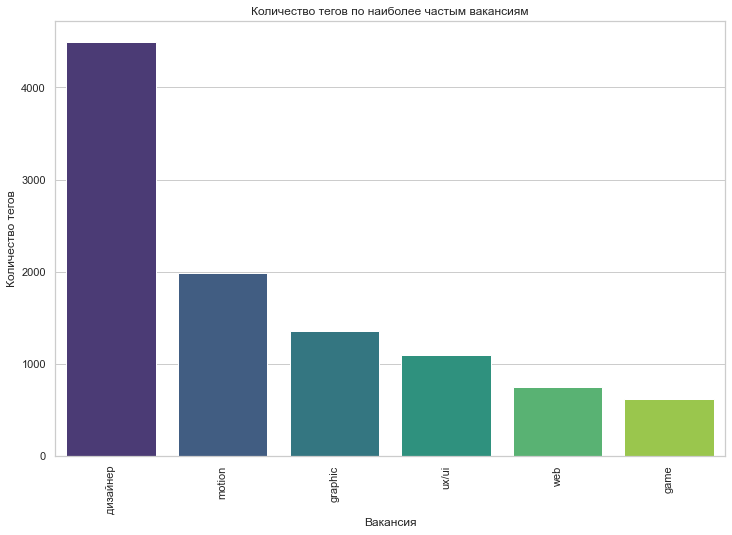

In [625]:
# Сортируем вакансии по количеству тегов (по убыванию)
sorted_positions = tag_counts.sort_values(ascending=False)

# Выбираем первые 6 вакансий с наибольшим количеством тегов
top_positions = sorted_positions.head(6).index.tolist()

# Фильтруем данные по выбранным вакансиям
filtered_data = tag_counts.loc[top_positions]

# Построение графика количества тегов по выбранным вакансиям
plt.figure(figsize=(12, 8))
sns.barplot(x=filtered_data.index, y=filtered_data.values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Количество тегов по наиболее частым вакансиям')
plt.xlabel('Вакансия')
plt.ylabel('Количество тегов')
plt.show()

In [206]:
dtframe = df_tags.copy()

In [997]:
dtframe

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name,age_numeric,converted_salary,employment_normalize,employment_standardized,word_counts,cleaned_experience,total_months,processed_tags
0,Game designer,мужчина,38,казань,25000₽,"полная занятость, частичная занятость, проектн...",19 лет 5 месяцев,высшее образование магистр,"[Веб-дизайн, Графические редакторы, Графически...",game дизайнер,game,38.0,25000.0,полная занятость частичная занятость проектная...,частичная проектная полная стажировка,"{'частичная': 1, 'проектная': 1, 'полная': 1, ...",19 год 5 месяц,233,"[вебдизайн, графический, редактор, графический..."
1,Game Designer,мужчина,27,балашиха,,"полная занятость, частичная занятость, проектн...",9 месяцев,среднее специальное образование,"[Ответственность, Усидчивость, Поиск информаци...",game дизайнер,game,27.0,NaN,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 месяц,9,"[ответственность, усидчивость, поиск, информац..."
2,Game Designer,мужчина,25,сербия,,полная занятость,2 года 5 месяцев,неполное высшее образование,"[Работа в команде, Unity, Git hub, Trello, Mir...",game дизайнер,game,25.0,NaN,полная занятость,полная,{'полная': 1},2 год 5 месяц,29,"[работа, команда, unity, git, hub, trello, mir..."
3,Game designer,мужчина,31,москва,,"full time, project work",10 years 8 months,высшее образование,"[Game design, Unity, Git, C#, Blender 3D]",game дизайнер,game,31.0,NaN,полная занятость проектная работа,проектная полная,"{'проектная': 1, 'полная': 1}",10 год 8 месяц,128,"[game, design, unity, git, c, blender]"
4,Game designer,мужчина,32,санкт петербург,1500$,полная занятость,7 лет 4 месяца,высшее образование магистр,"[Английский язык, Пользователь ПК, Грамотная р...",game дизайнер,game,32.0,137445.0,полная занятость,полная,{'полная': 1},7 год 4 месяц,88,"[английский, язык, пользователь, пк, грамотный..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10842,Jewelry Designer,женщина,29,москва,40000₽,"полная занятость, частичная занятость, проектн...",9 лет 7 месяцев,высшее образование бакалавр,"[Пользователь ПК, Adobe Photoshop, Английский ...",jewelry дизайнер,дизайнер,29.0,40000.0,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 год 7 месяц,115,"[пользователь, пк, adobe, photoshop, английски..."
10843,Motion Designer,мужчина,35,москва,320000₽,полная занятость,13 лет 5 месяцев,неполное высшее образование,"[Видеомонтаж, Adobe After Effect, Cinema 4D, Г...",motion дизайнер,motion,35.0,320000.0,полная занятость,полная,{'полная': 1},13 год 5 месяц,161,"[видеомонтаж, adobe, effect, cinema, графическ..."
10844,Дизайнер,мужчина,35,москва,50000₽,полная занятость,5 лет 8 месяцев,среднее специальное образование,"[Adobe Photoshop, Веб-дизайн, Графический диза...",дизайнер,дизайнер,35.0,50000.0,полная занятость,полная,{'полная': 1},5 год 8 месяц,68,"[adobe, photoshop, вебдизайн, графический, диз..."
10845,Дизайнер-консультант,женщина,38,москва,25000₽,"частичная занятость, проектная работа",13 лет 4 месяца,среднее специальное образование,[Консультирование клиентов],дизайнер консультант,дизайнер,38.0,25000.0,частичная занятость проектная работа,частичная проектная,"{'частичная': 1, 'проектная': 1}",13 год 4 месяц,160,"[консультирование, клиент]"


# Вакансии

In [30]:
data_vacancies = pd.read_json('/Users/beskrovnayaaaaa/Downloads/dataset_vacanci.json', orient='records')
data_vacancies

,name,salary,required_experience,employment,description,skills,time_publication,place
0,Lead Game Designer,,3–6 лет,"Полная занятость, удаленная работа","\n\n\n\n\n\n\n\n\n\nВы - наш человек, если у в...","Gamedev, Управление командой",11 мая 2024,Москве
1,Game Designer (Core),,не требуется,"Полная занятость, полный день","Привет!Мы - команда BLACKHUB Games, и сейчас м...","JSON API, F2P, A/B тесты, Проектная документация",11 мая 2024,Санкт-Петербурге
2,Game Designer (Economy/Monetization designer),,3–6 лет,"Полная занятость, полный день",Lesta Games (ООО «Гейм Стрим» – минский центр ...,,11 мая 2024,Минске
3,Game Designer Мета-геймплея,,1–3 года,"Полная занятость, полный день",Lesta Games ведёт разработку игровых проектов ...,"Game Design, Gamedev, Английский язык",11 мая 2024,Санкт-Петербурге
4,Game Designer (стажер),,не требуется,"Стажировка, полный день",Lesta Games ведёт разработку игровых проектов ...,"Английский язык, Game Design, Управление време...",11 мая 2024,Санкт-Петербурге
...,...,...,...,...,...,...,...,...
4700,Graphic Designer (Marketing),,1–3 года,"Полная занятость, полный день",\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n...,"Graphic Design, Microsoft Office, English, Des...",24 апреля 2024,Ташкенте
4701,3D Моушен-дизайнер,от 80 до 120 ₽ на руки,3–6 лет,"Проектная работа/разовое задание, полный день",Обязанности: Создание видео-контента и аними...,,1 мая 2024,Москве
4702,Графический дизайнер,от 70 ₽ на руки,1–3 года,"Полная занятость, полный день","EWA PRODUCT - молодая, амбициозная компания, к...",,16 апреля 2024,Новосибирске
4703,Дизайнер обложек для Youtube,от 900 $ на руки,1–3 года,"Полная занятость, полный день",,"Творческое мышление, Adobe Photoshop, Фотография",18 апреля 2024,Алматы


## Название

In [31]:
data_vacancies['name'].nunique()

3035

In [32]:
dv = data_vacancies.copy()

In [33]:
# Применяем функцию к столбцу 'name' в датасете
dv['normalized_name'] = dv['name'].apply(normalize_job_title)

In [34]:
dv['normalized_name'].unique()

array(['lead game дизайнер', 'game дизайнер core',
       'game дизайнер economy monetization дизайнер', ...,
       'head of product дизайнер', 'graphic дизайнер marketing',
       'дизайнер обложек для youtube'], dtype=object)

In [35]:
dv['standardized_name'] = dv['normalized_name'].apply(lambda x: standardize_and_remove_duplicates(x, keywords))

In [36]:
dv['standardized_name'].unique()

array(['game дизайнер', 'дизайнер', 'дизайнер product', 'дизайнер ux/ui',
       'web дизайнер ux/ui', 'motion дизайнер', 'game дизайнер ux/ui',
       'graphic дизайнер', 'game', 'graphic', 'motion', '',
       'game product', 'web', 'web дизайнер', 'product', 'web product',
       'motion graphic дизайнер', 'motion дизайнер web',
       'web дизайнер product', 'web ux/ui', 'ux/ui',
       'дизайнер product ux/ui', 'graphic дизайнер ux/ui',
       'web дизайнер product ux/ui', 'graphic ux/ui',
       'web graphic дизайнер ux/ui', 'web graphic дизайнер', 'web game',
       'web graphic', 'graphic дизайнер product'], dtype=object)

In [37]:
empty_rows_dv = dv[dv['standardized_name'].str.strip().eq('') | dv['standardized_name'].isna()]
empty_rows_dv

,name,salary,required_experience,employment,description,skills,time_publication,place,normalized_name,standardized_name
87,Gameplay Programmer,,1–3 года,"Полная занятость, полный день",Lesta Games ведёт разработку игровых проектов ...,"C++, Unreal Engine, UE",11 мая 2024,Москве,gameplay programmer,
88,Senior Gameplay Programmer / Senior UE Develop...,,3–6 лет,"Полная занятость, полный день","Lesta Games — международная группа компаний, о...","C++, Unreal Engine 5",11 мая 2024,Санкт-Петербурге,senior gameplay programmer senior ue developer c,
89,Senior Gameplay Programmer / Senior UE Develop...,,3–6 лет,"Полная занятость, полный день","Lesta Games — международная группа компаний, о...","C++, Unreal Engine",11 мая 2024,Москве,senior gameplay programmer senior ue developer c,
90,2D/3D Generalist в RnD отдел,,1–3 года,"Полная занятость, удаленная работа",Команда Beresnev Games в поиске опытного 2D/3D...,,11 мая 2024,Москве,2d 3d generalist в rnd отдел,
91,User acquisition manager,,1–3 года,"Полная занятость, полный день",Pride Games Studio — это команда единомышленни...,gamedev,11 мая 2024,Санкт-Петербурге,user acquisition manager,
...,...,...,...,...,...,...,...,...,...,...
4426,Менеджер по работе с дизайнерами (мебель),от 120 ₽ до вычета налогов,1–3 года,"Полная занятость, полный день",Привет!Мы – компания ВамСвет. Лидеры российско...,"Деловая коммуникация, Грамотная речь и письмо,...",11 мая 2024,Москве,менеджер по работе с дизайнерми мебель,
4522,Преподаватель по инженерной графике,от 70 ₽ до вычета налогов,1–3 года,"Полная занятость, полный день",\n\n\n\n\n\n\nРАБОТА В ОЭЗ «АЛАБУГА» — ЭТО:\n—...,"Solid Works, SolidWorks, Английский язык",6 мая 2024,Казани,преподаватель по инженерной graphicе,
4545,Менеджер по работе с дизайнерами и архитекторами,от 145 ₽ на руки,1–3 года,"Полная занятость, полный день",Коллектив ПроектГрупп - это команда профессион...,"Активные продажи, Поиск и привлечение клиентов...",11 мая 2024,Москве,менеджер по работе с дизайнерми и архитекторами,
4555,Менеджер по продажам и работе с дизайнерами (м...,от 60 до 100 ₽ на руки,1–3 года,"Полная занятость, полный день",Волховец – это федеральная компания по произво...,,11 мая 2024,Новосибирске,менеджер по продажам и работе с дизайнерми меж...,


In [38]:
dv = dv[dv['standardized_name'].str.strip().astype(bool)]

In [39]:
dv.reset_index(drop=True, inplace=True)

In [40]:
dv['standardized_name'].unique()

array(['game дизайнер', 'дизайнер', 'дизайнер product', 'дизайнер ux/ui',
       'web дизайнер ux/ui', 'motion дизайнер', 'game дизайнер ux/ui',
       'graphic дизайнер', 'game', 'graphic', 'motion', 'game product',
       'web', 'web дизайнер', 'product', 'web product',
       'motion graphic дизайнер', 'motion дизайнер web',
       'web дизайнер product', 'web ux/ui', 'ux/ui',
       'дизайнер product ux/ui', 'graphic дизайнер ux/ui',
       'web дизайнер product ux/ui', 'graphic ux/ui',
       'web graphic дизайнер ux/ui', 'web graphic дизайнер', 'web game',
       'web graphic', 'graphic дизайнер product'], dtype=object)

In [41]:
dv['standardized_name'] = dv['standardized_name'].apply(process_standardized_name)

In [42]:
dv['standardized_name'].unique()

array(['game', 'дизайнер', 'product', 'ux/ui', 'web ux/ui', 'motion',
       'game ux/ui', 'graphic', 'game product', 'web', 'web product',
       'motion graphic', 'motion web', 'product ux/ui', 'graphic ux/ui',
       'web product ux/ui', 'web graphic ux/ui', 'web graphic',
       'web game', 'graphic product'], dtype=object)

In [43]:
dv['standardized_name'].value_counts()

дизайнер             857
ux/ui                384
graphic              331
web                  305
product              296
motion               163
game                 143
web graphic           37
product ux/ui         37
web ux/ui             35
web product           13
motion graphic        10
graphic ux/ui          8
web product ux/ui      6
game ux/ui             4
game product           2
web graphic ux/ui      2
graphic product        2
motion web             1
web game               1
Name: standardized_name, dtype: int64

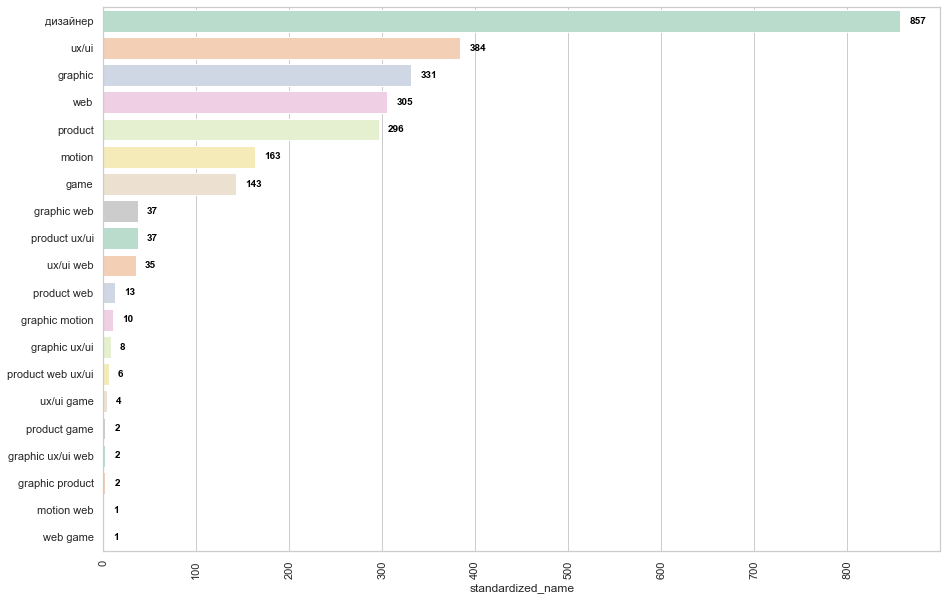

In [615]:
# Создание столбчатой диаграммы
plt.figure(figsize=(15, 10))
sns.barplot(x=dv['standardized_name'].value_counts(), y=dv['standardized_name'].value_counts().index, palette=sns.color_palette('Pastel2'))

# Добавление числа наблюдений над каждым столбцом
for i, v in enumerate(dv['standardized_name'].value_counts()):
    plt.text(v + 10, i + 0.1, str(v), color='black', fontsize=10, fontweight='bold')

plt.xticks(rotation=90)
plt.show()

## Опыт

In [616]:
dv['required_experience'].unique()

array(['3–6 лет', 'не требуется', '1–3 года', 'более 6 лет'], dtype=object)

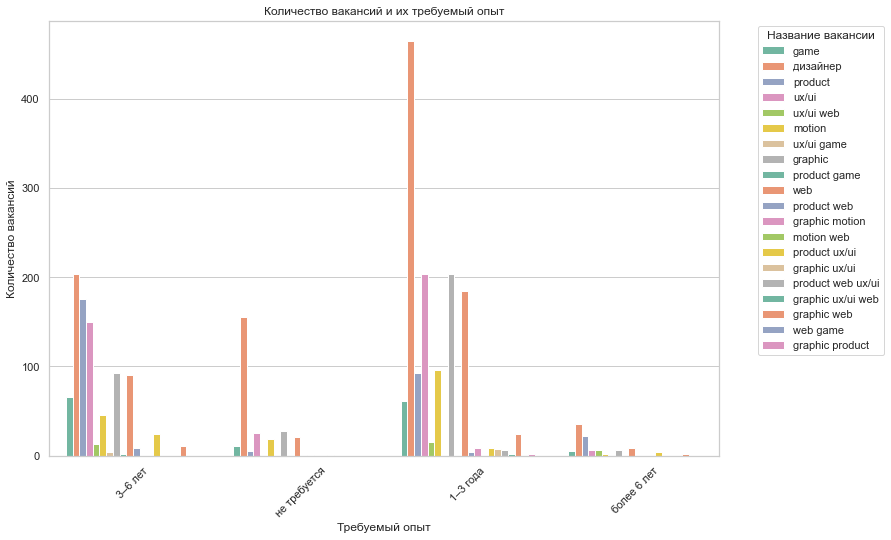

In [617]:
# Установка стиля seaborn для более приятного внешнего вида графиков
sns.set(style="whitegrid")

# Создание объекта matplotlib.figure.Figure и одного или нескольких объектов AxesSubplot
plt.figure(figsize=(12, 8))

# Используем seaborn для построения столбчатой диаграммы
sns.countplot(x='required_experience', hue='standardized_name', data=dv, palette='Set2')

# Настройка заголовка и меток осей
plt.title('Количество вакансий и их требуемый опыт')
plt.xlabel('Требуемый опыт')
plt.ylabel('Количество вакансий')

# Поворот меток по оси x для лучшей читаемости
plt.xticks(rotation=45)

# Показать легенду справа вне графика
plt.legend(title='Название вакансии', bbox_to_anchor=(1.05, 1), loc='upper left')

# Отображение графика
plt.show()

## Зарплата

In [44]:
dv['salary'].unique()

array(['', 'от 130 ₽ на руки', 'от 3 до 4\xa0500 $ на руки',
       'от 2 до 4 $ до вычета налогов', 'от 80 до 200 ₽ на руки',
       'от 1\xa0500 до 3\xa0500 $ на руки', 'до 350 $ на руки',
       'от 80 до 160 ₽ на руки', 'от 2\xa0500 Br на руки',
       'от 150 ₽ на руки', 'от 800 $ на руки',
       'от 150 ₽ до вычета налогов', 'от 850 до 1\xa0300 $ на руки',
       'от 80 до 150 ₽ на руки', 'от 120 ₽ на руки',
       'от 1\xa0200 до 1\xa0500 $ на руки', 'от 400 до 500 $ на руки',
       'до 750 $ на руки', 'от 300 до 500 ₸ на руки',
       'от 90 до 160 ₽ на руки', 'от 50 до 200 ₽ на руки',
       'от 60 до 100 ₽ на руки', 'до 70 ₽ до вычета налогов',
       'от 2 Br до вычета налогов', 'от 70 до 120 ₽ на руки',
       'до 40 ₽ до вычета налогов', 'от 55 ₽ на руки',
       'до 150 ₽ до вычета налогов', 'от 120 до 180 ₽ на руки',
       'от 140 ₽ на руки', 'от 40 до 40 ₽ на руки', 'от 300 ₸ на руки',
       'от 130 до 160 ₽ на руки', 'от 80 ₽ до вычета налогов',
       'от 50 ₽ на 

In [45]:
dv_p = dv.copy()

In [46]:
# Функция для извлечения чисел и валют из строки
def extract_salary_details(row):    
    # Удаляем пробелы
    text_without_spaces = ''.join(row.split())
    
    # Извлекаем числа из строки
    numbers = re.findall(r'\d+', text_without_spaces)
    
    # Извлекаем валюту из строки
    currency_matches = re.findall(r'[₽$Br₸₴₼€so\'mс]', row)
    
    # Преобразуем валюту в единый формат и добавляем 000 к числам при необходимости
        # Преобразуем валюту в единый формат и добавляем 000 к числам при необходимости
    currency = []
    for match in currency_matches:
        if match == 'с':
            currency.append('сом')
            # Добавляем 000 к числам, если валюта сом
            numbers = [num + '000' if int(num + '000') <= 1000000 else num for num in numbers]
        elif match == 's':
            currency.append('s')
            # Добавляем 000 к числам, если валюта so'm
            numbers = [num + '000' if int(num + '000') <= 1000000 else num for num in numbers]
        elif match == '₸':
            currency.append('₸')
            # Добавляем 000 к числам, если валюта ₸
            numbers = [num + '000' if int(num + '000') <= 1000000 else num for num in numbers]
        elif match == '₽':
            currency.append('₽')
            # Добавляем 000 к числам, если валюта ₽
            numbers = [num + '000' if int(num + '000') <= 1000000 else num for num in numbers]
        else:
            currency.append(match)
    
    return numbers, currency


def calculate_mean(numbers):
    # Преобразуем каждый элемент из списка строк в числа
    numbers = [int(num) for num in numbers if num.isdigit()]
    
    # Проверяем, что список не пустой перед вычислением среднего значения
    if numbers:
        mean_salary = sum(numbers) / len(numbers)
        return mean_salary
    else:
        return None
    
def mean_currency(row):
    mean_s = row['mean_salary']
    cur = row['currency']
    # Преобразуем список валюты в строку, соединяя элементы через пробел
    cur_str = ' '.join(cur)
    return f"{mean_s} {cur_str}"
    
# Применяем функцию к столбцу 'salary'
dv_p[['numbers', 'currency']] = dv_p['salary'].apply(extract_salary_details).apply(pd.Series)
# Применяем функцию подсчета среднего к столбцу 'numbers'
dv_p['mean_salary'] = dv_p['numbers'].apply(calculate_mean)

In [47]:
dv_p['mean_currency'] = dv_p.apply(mean_currency, axis=1)
# Выводим результаты
dv_p[['salary', 'numbers', 'mean_salary', 'currency', 'mean_currency']]

,salary,numbers,mean_salary,currency,mean_currency
0,,[],NaN,[],nan
1,,[],NaN,[],nan
2,,[],NaN,[],nan
3,,[],NaN,[],nan
4,,[],NaN,[],nan
...,...,...,...,...,...
2632,,[],NaN,[],nan
2633,от 80 до 120 ₽ на руки,"[80000, 120000]",100000.0,[₽],100000.0 ₽
2634,от 70 ₽ на руки,[70000],70000.0,[₽],70000.0 ₽
2635,от 900 $ на руки,[900],900.0,[$],900.0 $


In [48]:
# Применяем функцию convert_salary к столбцу 'salary'
dv_p['converted_salary'] = dv_p['mean_currency'].apply(convert_salary)
dv_p

,name,salary,required_experience,employment,description,skills,time_publication,place,normalized_name,standardized_name,numbers,currency,mean_salary,mean_currency,converted_salary
0,Lead Game Designer,,3–6 лет,"Полная занятость, удаленная работа","\n\n\n\n\n\n\n\n\n\nВы - наш человек, если у в...","Gamedev, Управление командой",11 мая 2024,Москве,lead game дизайнер,game,[],[],NaN,nan,NaN
1,Game Designer (Core),,не требуется,"Полная занятость, полный день","Привет!Мы - команда BLACKHUB Games, и сейчас м...","JSON API, F2P, A/B тесты, Проектная документация",11 мая 2024,Санкт-Петербурге,game дизайнер core,game,[],[],NaN,nan,NaN
2,Game Designer (Economy/Monetization designer),,3–6 лет,"Полная занятость, полный день",Lesta Games (ООО «Гейм Стрим» – минский центр ...,,11 мая 2024,Минске,game дизайнер economy monetization дизайнер,game,[],[],NaN,nan,NaN
3,Game Designer Мета-геймплея,,1–3 года,"Полная занятость, полный день",Lesta Games ведёт разработку игровых проектов ...,"Game Design, Gamedev, Английский язык",11 мая 2024,Санкт-Петербурге,game дизайнер мета gameплея,game,[],[],NaN,nan,NaN
4,Game Designer (стажер),,не требуется,"Стажировка, полный день",Lesta Games ведёт разработку игровых проектов ...,"Английский язык, Game Design, Управление време...",11 мая 2024,Санкт-Петербурге,game дизайнер стажер,game,[],[],NaN,nan,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2632,Graphic Designer (Marketing),,1–3 года,"Полная занятость, полный день",\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n...,"Graphic Design, Microsoft Office, English, Des...",24 апреля 2024,Ташкенте,graphic дизайнер marketing,graphic,[],[],NaN,nan,NaN
2633,3D Моушен-дизайнер,от 80 до 120 ₽ на руки,3–6 лет,"Проектная работа/разовое задание, полный день",Обязанности: Создание видео-контента и аними...,,1 мая 2024,Москве,3d motion дизайнер,motion,"[80000, 120000]",[₽],100000.0,100000.0 ₽,100000.0
2634,Графический дизайнер,от 70 ₽ на руки,1–3 года,"Полная занятость, полный день","EWA PRODUCT - молодая, амбициозная компания, к...",,16 апреля 2024,Новосибирске,graphic дизайнер,graphic,[70000],[₽],70000.0,70000.0 ₽,70000.0
2635,Дизайнер обложек для Youtube,от 900 $ на руки,1–3 года,"Полная занятость, полный день",,"Творческое мышление, Adobe Photoshop, Фотография",18 апреля 2024,Алматы,дизайнер обложек для youtube,дизайнер,[900],[$],900.0,900.0 $,82467.0


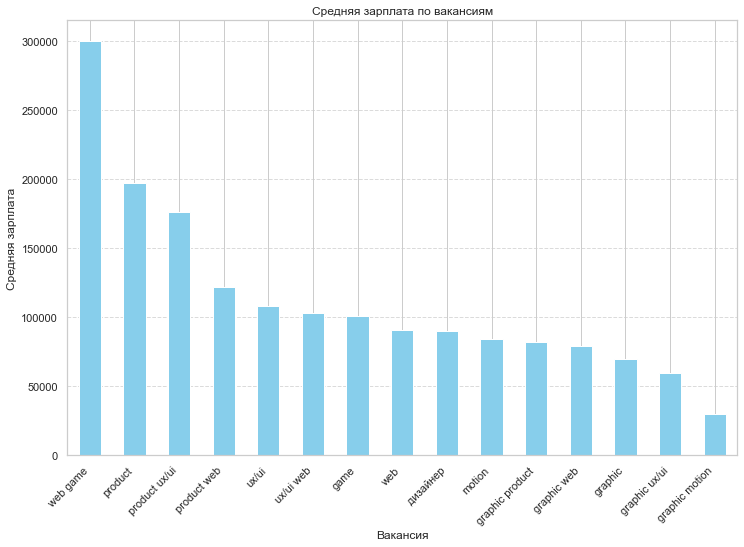

In [623]:
# Фильтруем DataFrame, исключая пустые значения и значения равные 0 в столбце 'converted_salary'
filtered_data = dv_p[dv_p['converted_salary'].notnull() & (dv_p['converted_salary'] != 0)]

# Группируем данные по вакансиям ('standardized_name') и вычисляем среднее значение сконвертированной зарплаты
mean_salary_by_job = filtered_data.groupby('standardized_name')['converted_salary'].mean().sort_values(ascending=False)

# Создаем график средней сконвертированной зарплаты по вакансиям
plt.figure(figsize=(12, 8))
mean_salary_by_job.plot(kind='bar', color='skyblue')
plt.title('Средняя зарплата по вакансиям')
plt.xlabel('Вакансия')
plt.ylabel('Средняя зарплата')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## Тип занятости

In [49]:
dv_e = dv_p.copy()

In [50]:
# Приведение значений столбца 'employment' к нижнему регистру
dv_e['employment'] = dv_e['employment'].str.lower()

# Определение шести наиболее часто встречающихся вакансий
top_positions = dv_e['standardized_name'].value_counts().head(6).index.tolist()

# Фильтрация данных только по шести наиболее часто встречающимся вакансиям
filtered_data = dv_e[dv_e['standardized_name'].isin(top_positions)]

In [51]:
dv_e['employment'].unique()

array(['полная занятость, удаленная работа',
       'полная занятость, полный день', 'стажировка, полный день',
       'полная занятость, гибкий график',
       'проектная работа/разовое задание, удаленная работа',
       'частичная занятость, удаленная работа',
       'частичная занятость, полный день',
       'полная занятость, сменный график',
       'частичная занятость, гибкий график',
       'проектная работа/разовое задание, полный день',
       'проектная работа/разовое задание, гибкий график',
       'стажировка, удаленная работа', 'стажировка, гибкий график',
       'частичная занятость, сменный график'], dtype=object)

In [52]:
# Разделение записей по запятым или дефисам
dv_e['employment_unique'] = dv_e['employment'].apply(lambda x: [item.strip() for item in x.replace('/', ',').split(',')])
# Преобразование каждой записи в отдельную строку
dv_e = dv_e.explode('employment_unique')

# Вывод результата
dv_e['employment_unique'].unique()

array(['полная занятость', 'удаленная работа', 'полный день',
       'стажировка', 'гибкий график', 'проектная работа',
       'разовое задание', 'частичная занятость', 'сменный график'],
      dtype=object)

In [53]:
# Группировка по вакансиям и типам занятости, подсчет количества уникальных типов занятости для каждой вакансии
employment_counts = dv_e.groupby(['standardized_name', 'employment_unique']).size().unstack(fill_value=0)

# Сортировка по количеству уникальных типов занятости
employment_counts = employment_counts.loc[top_positions]

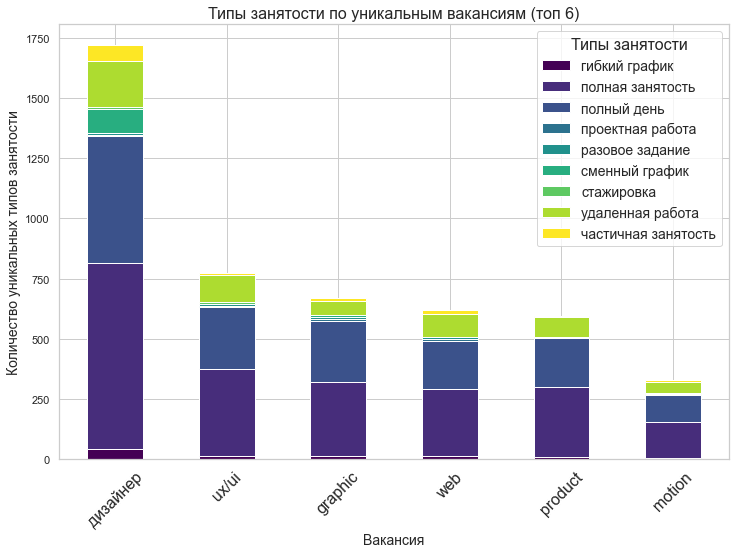

In [683]:
fig, ax = plt.subplots(figsize=(12, 8))
employment_counts.plot(kind='bar', stacked=True, cmap='viridis', ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=16)  # Установка размера шрифта для подписей по оси X
ax.set_title('Типы занятости по уникальным вакансиям (топ 6)', fontsize=16)  # Установка размера шрифта заголовка
ax.set_xlabel('Вакансия', fontsize=14)  # Установка размера шрифта подписи оси X
ax.set_ylabel('Количество уникальных типов занятости', fontsize=14)  # Установка размера шрифта подписи оси Y
ax.legend(title='Типы занятости', fontsize=14, title_fontsize='16')  # Установка размера шрифта для легенды
plt.show()

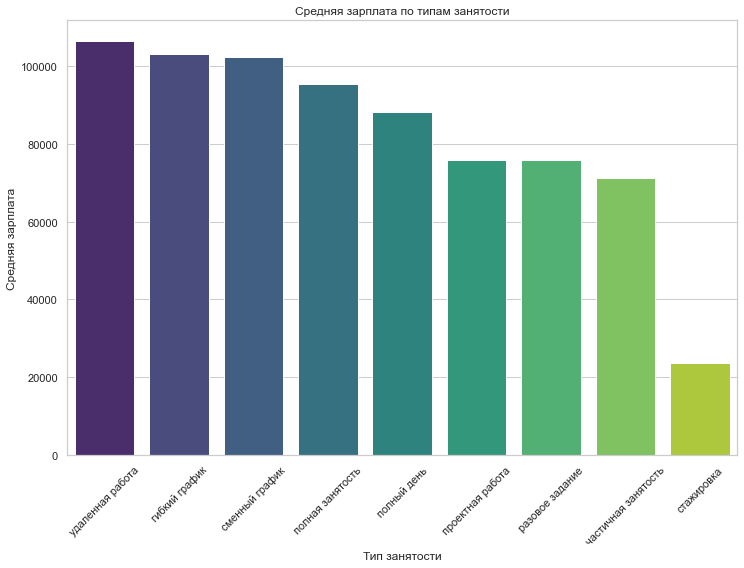

In [681]:
# Группировка данных по типам занятости и вычисление средней зарплаты
mean_salary_by_employment = dv_e.groupby('employment_unique')['converted_salary'].mean().sort_values(ascending=False)

# Построение графика средней зарплаты по типам занятости
plt.figure(figsize=(12, 8))
sns.barplot(x=mean_salary_by_employment.index, y=mean_salary_by_employment.values, palette='viridis')
plt.xticks(rotation=45)
plt.title('Средняя зарплата по типам занятости')
plt.xlabel('Тип занятости')
plt.ylabel('Средняя зарплата')
plt.show()

## Город

In [54]:
dv_place = dv_e.copy()

In [55]:
dv_place['place'].unique()

array([' Москве', ' Санкт-Петербурге', ' Минске', ' Ташкенте', ' Армении',
       ' Сербии', ' Краснодаре', ' Кипре', ' Перми', ' Другой стране',
       ' Алматы', ' Черногории', ' Новосибирске', ' Курске', ' Польше',
       ' Казани', ' Великом Новгороде', ' Тбилиси', ' Калининграде',
       ' Челябинске', ' Испании', ' Саратове', ' Астане', ' Тольятти',
       ' Болгарии', ' Смоленске', ' Нидерландах', ' Воронеже',
       ' Нижнем Новгороде', ' Батуми', ' Айете', ' Малайзии',
       ' Индонезии', ' Таиланде', ' Индии', ' Турции', ' Бишкеке',
       ' Ростове-на-Дону', ' Нальчике', ' Ставрополе', ' Гомеле',
       ' Томске', ' Екатеринбурге', ' Омске', ' Самаре', ' Сочи',
       ' Симферополе', ' Рязани', ' Витебске', ' Тюмени', ' Липецке',
       ' Балашихе', ' Гродно', ' Уфе', ' Красноярске', ' Волгограде',
       ' Ижевске', ' Барнауле', ' Ульяновске', ' Иркутске', ' Хабаровске',
       ' Ярославле', ' городе Владивостоке', ' Махачкале', ' Оренбурге',
       ' Кемерове', ' Новокузн

In [56]:
# Создаем экземпляр класса MorphAnalyzer для преобразования слов
morph = pymorphy2.MorphAnalyzer()

# Словарь для замен
replace_dict = {
    ' московский': 'москва',
    ' набережных челна': 'набережные челны',
    ' кирове (кировская область)': 'киров',
    ' городе владимир': 'владимир',
    ' городе владикавказ': 'владикавказ',
    ' волжском (волгоградская область)': 'волжск',
    ' михайловке (волгоградской области)': 'михайловка',
    ' нижнем тагиля': 'нижний тагил',
    ' посёлке совхоза имени ленина': 'посёлок совхоза имени ленина'
}

# Применяем замены к столбцу 'place' в датафрейме dv_place
dv_place['place'] = dv_place['place'].apply(lambda x: ' '.join([replace_dict.get(word.lower(), morph.parse(word)[0].normal_form) for word in x.split()]))

# Выводим обновленный датафрейм с примененными заменами
dv_place['place'].unique()

array(['москва', 'санкт-петербург', 'минск', 'ташкент', 'армения',
       'сербия', 'краснодар', 'кипр', 'пермь', 'другой страна', 'алматы',
       'черногория', 'новосибирск', 'курск', 'польша', 'казань',
       'великий новгород', 'тбилиси', 'калининград', 'челябинск',
       'испания', 'саратов', 'астана', 'тольятти', 'болгария', 'смоленск',
       'нидерланды', 'воронеж', 'нижний новгород', 'батуми', 'айть',
       'малайзия', 'индонезия', 'таиланд', 'индия', 'турция', 'бишкек',
       'ростов-на-дону', 'нальчик', 'ставрополь', 'гомель', 'томск',
       'екатеринбург', 'омск', 'самара', 'сочи', 'симферополь', 'рязань',
       'витебск', 'тюмень', 'липецк', 'балашиха', 'гродно', 'уфа',
       'красноярск', 'волгоград', 'ижевск', 'барнаул', 'ульяновск',
       'иркутск', 'хабаровск', 'ярославль', 'город владивосток',
       'махачкала', 'оренбург', 'кемерово', 'новокузнецк',
       'набережный челны', 'астрахань', 'пенза',
       'киров (кировский область)', 'якутск', 'кострома', 'ор

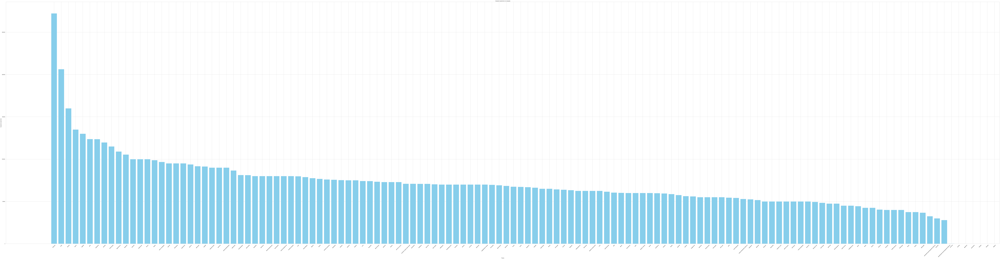

In [715]:
# Группируем данные по городам и вычисляем среднюю зарплату для каждого города
mean_salary_by_city = dv_place.groupby('place')['converted_salary'].mean().reset_index()

# Сортируем данные по средней зарплате
mean_salary_by_city = mean_salary_by_city.sort_values(by='converted_salary', ascending=False)

# Построение графика средней зарплаты по городам
plt.figure(figsize=(200, 50))
plt.bar(mean_salary_by_city['place'], mean_salary_by_city['converted_salary'], color='skyblue')
plt.title('Средняя зарплата по городам')
plt.xlabel('Город')
plt.ylabel('Средняя зарплата')
plt.xticks(rotation=45)  # Поворот подписей по оси X для лучшей читаемости
plt.show()

In [717]:
# Группируем данные по городам и вычисляем среднюю зарплату для каждого города
mean_salary_by_city = dv_place.groupby('place')['converted_salary'].mean().reset_index()

# Сортируем города по убыванию средней зарплаты и выбираем первые 5 городов
top_cities = mean_salary_by_city.sort_values(by='converted_salary', ascending=False).head(5)['place']

# Выводим типы занятости для каждого из выбранных городов
for city in top_cities:
    employment_types = dv_place[dv_place['place'] == city]['employment'].unique()
    vacancies_count = dv_place[dv_place['place'] == city].shape[0]
    print(f"Город: {city}, Типы занятости: {', '.join(employment_types)}, Количество вакансий: {vacancies_count}")

Город: тбилиси, Типы занятости: полная занятость, удаленная работа, полная занятость, полный день, стажировка, полный день, Количество вакансий: 70
Город: кипр, Типы занятости: полная занятость, удаленная работа, полная занятость, полный день, Количество вакансий: 34
Город: троицк, Типы занятости: полная занятость, гибкий график, Количество вакансий: 2
Город: сургут, Типы занятости: частичная занятость, сменный график, Количество вакансий: 2
Город: тамбов, Типы занятости: проектная работа/разовое задание, полный день, полная занятость, полный день, Количество вакансий: 5


## Дата публикации

In [66]:
dv_time = dv_place.copy()

In [67]:
dv_time['time_publication'].unique()

array([' 11 мая 2024 ', ' 10 мая 2024 ', ' 9 мая 2024 ', ' 8 мая 2024 ',
       ' 7 мая 2024 ', ' 6 мая 2024 ', ' 5 мая 2024 ', ' 2 мая 2024 ',
       ' 3 мая 2024 ', ' 27 апреля 2024 ', ' 26 апреля 2024 ',
       ' 22 апреля 2024 ', ' 25 апреля 2024 ', ' 28 апреля 2024 ',
       ' 24 апреля 2024 ', ' 19 апреля 2024 ', ' 18 апреля 2024 ',
       ' 17 апреля 2024 ', ' 16 апреля 2024 ', ' 23 апреля 2024 ',
       ' 1 мая 2024 ', ' 15 апреля 2024 ', ' 30 апреля 2024 ',
       ' 21 апреля 2024 ', ' 12 апреля 2024 ', ' 29 апреля 2024 ',
       ' 4 мая 2024 ', ' 11 апреля 2024 ', ' 13 апреля 2024 ',
       ' 14 апреля 2024 ', ' 20 апреля 2024 '], dtype=object)

In [69]:
from datetime import datetime

In [70]:
def extract_day_month_year(date_str):
    date_str = date_str.strip()  # Удаление пробелов по краям строки
    match = re.match(r'(\d+)\s+(\w+)\s+(\d{4})', date_str)
    if match:
        day = match.group(1)
        month_name = match.group(2).lower()
        year = match.group(3)
        
        # Проверка на корректность числа дня, месяца и года
        if day.isdigit() and month_name.isalpha() and year.isdigit():
            return int(day), month_name, int(year)
        else:
            return None
    else:
        return None

# Словарь для преобразования названий месяцев в числовой формат
months_dict = {
    'апреля': 4,
    'мая': 5
    # Добавьте другие месяцы по мере необходимости
}

# Преобразование строки с датой в формат datetime
def convert_to_datetime(date_str):
    result = extract_day_month_year(date_str)
    if result is not None:
        day, month_name, year = result
        if month_name in months_dict:
            month = months_dict[month_name]
            return datetime(year, month, day)
        else:
            raise ValueError(f'Неверное название месяца: {month_name}')
    else:
        raise ValueError(f'Неверный формат даты: {date_str}')

# Применение функции convert_to_datetime ко всем значениям столбца 'time_publication'
dv_time['time_publication'] = dv_time['time_publication'].apply(convert_to_datetime)

# # Проверка типа данных столбца 'time_publication'
# print(dv_time['time_publication'].dtype)

# Подсчитываем количество вакансий по дням публикации
vacancies_by_day = dv_time['time_publication'].dt.date.value_counts().sort_index()

# Выводим результаты
print("Количество вакансий по дням публикации:")
print(vacancies_by_day)

Количество вакансий по дням публикации:
2024-04-11      6
2024-04-12    109
2024-04-13      6
2024-04-14     12
2024-04-15    133
2024-04-16    142
2024-04-17    100
2024-04-18     89
2024-04-19     91
2024-04-20      8
2024-04-21     10
2024-04-22    138
2024-04-23    170
2024-04-24    142
2024-04-25    126
2024-04-26    190
2024-04-27    116
2024-04-28     26
2024-04-29     52
2024-04-30     52
2024-05-01     41
2024-05-02    310
2024-05-03    191
2024-05-04     36
2024-05-05     16
2024-05-06    305
2024-05-07    194
2024-05-08    308
2024-05-09    562
2024-05-10    683
2024-05-11    946
Name: time_publication, dtype: int64


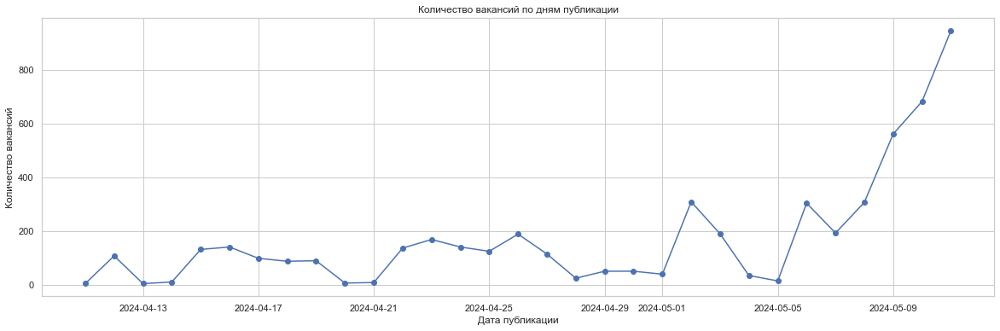

In [1040]:
# Установим 'time_publication' как индекс для DataFrame
dv_time.set_index('time_publication', inplace=True)

# Подсчет количества вакансий по дням публикации
vacancies_by_day = dv_time.index.value_counts().sort_index()

# Визуализация количества вакансий по дням
plt.figure(figsize=(20, 6))
plt.plot(vacancies_by_day.index, vacancies_by_day.values, marker='o', linestyle='-')
plt.title('Количество вакансий по дням публикации')
plt.xlabel('Дата публикации')
plt.ylabel('Количество вакансий')
plt.grid(True)
plt.show()

In [1041]:
# Проведем тест Дики-Фуллера на стационарность
result = adfuller(vacancies_by_day)

print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: 3.001538
p-value: 1.000000
Critical Values:
	1%: -3.724
	5%: -2.986
	10%: -2.633


Следовательно, ряд нестационарен

In [1042]:
# Преобразование pandas Series в numpy array
vacancies_by_day_values = vacancies_by_day.values
print(vacancies_by_day_values)

[  6 109   6  12 133 142 100  89  91   8  10 138 170 142 126 190 116  26
  52  52  41 310 191  36  16 305 194 308 562 683 946]


In [1043]:
# Применение преобразования Бокса-Кокса
vacancies_by_day_boxcox, lmbda = stats.boxcox(vacancies_by_day_values + 1)

# Проверяем стационарность преобразованного ряда
result_transformed = adfuller(vacancies_by_day_boxcox)
print('ADF Statistic (transformed): %f' % result_transformed[0])
print('p-value (transformed): %f' % result_transformed[1])

ADF Statistic (transformed): -2.878233
p-value (transformed): 0.047938


p-value < 0.05 => ряд стационарен

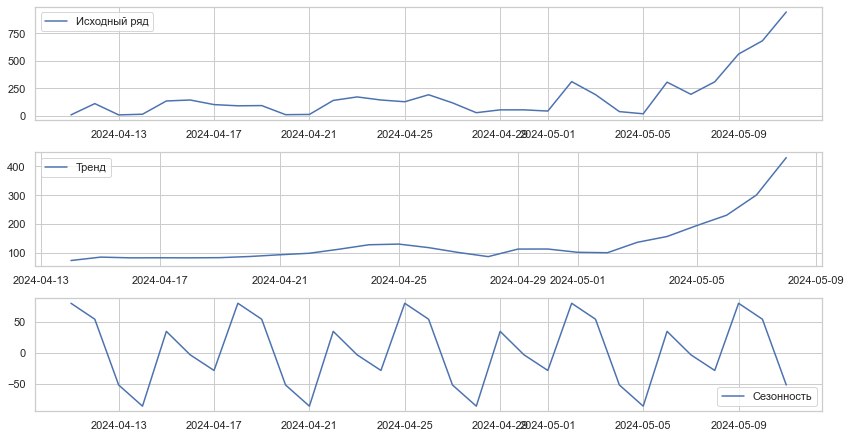

In [1044]:
# Разложение временного ряда на тренд, сезонность и шум
decomposition = seasonal_decompose(vacancies_by_day, model='additive')

# Визуализация тренда, сезонности и шума
plt.figure(figsize=(12, 8))

# Визуализация исходного временного ряда
plt.subplot(411)
plt.plot(vacancies_by_day, label='Исходный ряд')
plt.legend()

# Визуализация тренда
plt.subplot(412)
plt.plot(decomposition.trend, label='Тренд')
plt.legend()

# Визуализация сезонности
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Сезонность')
plt.legend()

plt.tight_layout()
plt.show()

На графике видно, что количество вакансий увеличивается со временем. Это тренд восходящего направления.

На графике видно, что количество вакансий имеет периодические колебания, которые повторяются каждый понедельник и каждый четверг.

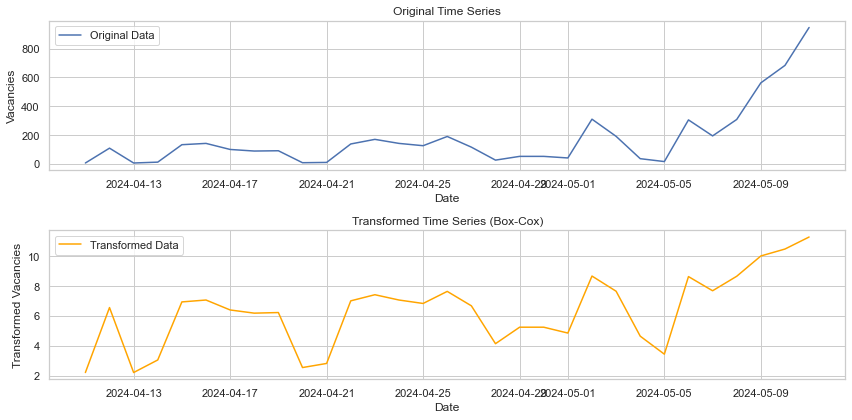

In [1045]:
# Визуализация временного ряда до и после преобразования
plt.figure(figsize=(12, 6))
plt.subplot(211)
plt.plot(vacancies_by_day.index, vacancies_by_day.values, label='Original Data')
plt.title('Original Time Series')
plt.xlabel('Date')
plt.ylabel('Vacancies')
plt.legend()

plt.subplot(212)
plt.plot(vacancies_by_day.index, vacancies_by_day_boxcox, label='Transformed Data', color='orange')
plt.title('Transformed Time Series (Box-Cox)')
plt.xlabel('Date')
plt.ylabel('Transformed Vacancies')
plt.legend()

plt.tight_layout()
plt.show()

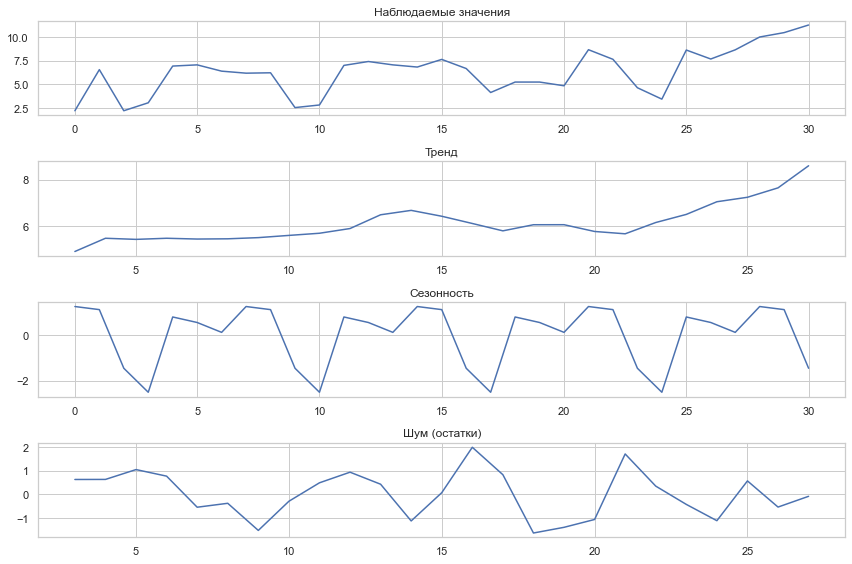

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


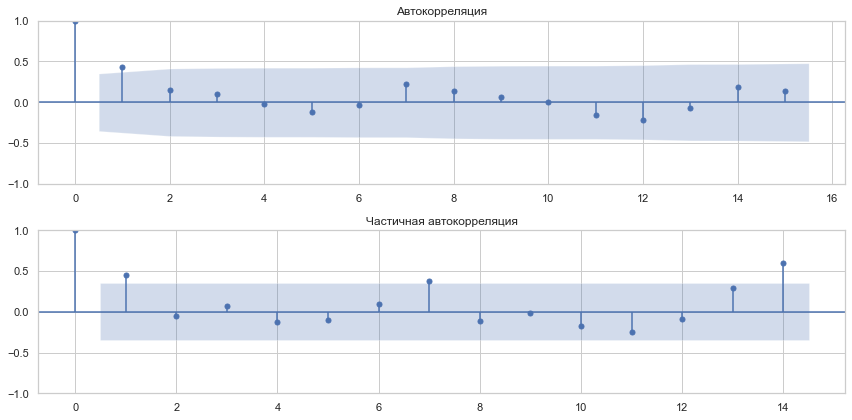

In [855]:
# Разложение временного ряда на тренд, сезонность и шум
decomposition = seasonal_decompose(vacancies_by_day_boxcox, model='additive', period=7)  # Указываем период сезонности

# Визуализация разложения
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(decomposition.observed)
plt.title('Наблюдаемые значения')
plt.subplot(412)
plt.plot(decomposition.trend)
plt.title('Тренд')
plt.subplot(413)
plt.plot(decomposition.seasonal)
plt.title('Сезонность')
plt.subplot(414)
plt.plot(decomposition.resid)
plt.title('Шум (остатки)')
plt.tight_layout()
plt.show()

# Графики автокорреляции и частной автокорреляции
plt.figure(figsize=(12, 6))
plt.subplot(211)
plot_acf(vacancies_by_day_boxcox, ax=plt.gca())
plt.title('Автокорреляция')

plt.subplot(212)
plot_pacf(vacancies_by_day_boxcox, lags=14, ax=plt.gca())
plt.title('Частичная автокорреляция')

plt.tight_layout()
plt.show()

тренд восходящий, сезонность имеется 

## Прогноз

In [71]:
dv_prognoz = dv_time.copy()

In [88]:
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [80]:
print(dv_prognoz.isna().sum())  # Проверка на NaN значения

name                      0
salary                    0
required_experience       0
employment                0
description               0
skills                    0
time_publication          0
place                     0
normalized_name           0
standardized_name         0
numbers                   0
currency                  0
mean_salary            2092
mean_currency             0
converted_salary       2140
employment_unique         0
encoded_name              0
scaled_salary          2140
dtype: int64


In [81]:
dv_prognoz['converted_salary'] = dv_prognoz['converted_salary'].fillna(dv_prognoz['converted_salary'].median())

In [82]:
print(dv_prognoz[['converted_salary']].isna().sum())

converted_salary    0
dtype: int64


In [103]:
import tensorflow as tf
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [104]:
# Преобразование времени публикации
dv_prognoz['time_publication'] = pd.to_datetime(dv_prognoz['time_publication'])

# Исключение вакансий с названием "Дизайнер"
dv_prognoz = dv_prognoz[~dv_prognoz['standardized_name'].str.contains('дизайнер', case=False)]

# Преобразование категориальных данных (название вакансии) в числовой формат
label_encoder = LabelEncoder()
dv_prognoz['encoded_name'] = label_encoder.fit_transform(dv_prognoz['standardized_name'])

# Масштабирование числовых данных (зарплата)
scaler = MinMaxScaler()
dv_prognoz['scaled_salary'] = scaler.fit_transform(dv_prognoz[['converted_salary']])

# Подготовка данных для обучения модели
X = dv_prognoz[['encoded_name', 'scaled_salary']].values
y = label_encoder.transform(dv_prognoz['standardized_name'])

# Разделение данных на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [113]:
# K-Nearest Neighbors
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)
accuracy_knn = accuracy_score(y_test, y_pred_knn)

# Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)

# Logistic Regression
lr = LogisticRegression(max_iter=1000, random_state=42)
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)
accuracy_lr = accuracy_score(y_test, y_pred_lr)

# Gradient Boosting
gb = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb.fit(X_train, y_train)
y_pred_gb = gb.predict(X_test)
accuracy_gb = accuracy_score(y_test, y_pred_gb)

# Neural Network
model = Sequential([
    Dense(64, activation='relu', input_shape=(2,)),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(len(np.unique(y)), activation='softmax')  # Количество классов определяется динамически
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0)

y_pred_nn_prob = model.predict(X_test)
y_pred_nn = np.argmax(y_pred_nn_prob, axis=1)
accuracy_nn = accuracy_score(y_test, y_pred_nn)

# Вывод точностей моделей
print("Точности моделей:")
print(f"K-Nearest Neighbors: {accuracy_knn:.4f}")
print(f"Random Forest: {accuracy_rf:.4f}")
print(f"Logistic Regression: {accuracy_lr:.4f}")
print(f"Gradient Boosting: {accuracy_gb:.4f}")
print(f"Neural Network: {accuracy_nn:.4f}")

# Дополнительные метрики
def print_metrics(y_true, y_pred, model_name):
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    print(f"{model_name} Precision: {precision:.4f}")
    print(f"{model_name} Recall: {recall:.4f}")
    print(f"{model_name} F1 Score: {f1:.4f}")

print_metrics(y_test, y_pred_knn, "K-Nearest Neighbors")
print_metrics(y_test, y_pred_rf, "Random Forest")
print_metrics(y_test, y_pred_lr, "Logistic Regression")
print_metrics(y_test, y_pred_gb, "Gradient Boosting")
print_metrics(y_test, y_pred_nn, "Neural Network")

# Кросс-валидация
def cross_val_metrics(model, X, y, model_name):
    accuracy = cross_val_score(model, X, y, cv=5, scoring='accuracy').mean()
    y_pred = cross_val_predict(model, X, y, cv=5)
    precision = precision_score(y, y_pred, average='macro')
    recall = recall_score(y, y_pred, average='macro')
    f1 = f1_score(y, y_pred, average='macro')
    print(f"{model_name} Cross-Validated Accuracy: {accuracy:.4f}")
    print(f"{model_name} Cross-Validated Precision: {precision:.4f}")
    print(f"{model_name} Cross-Validated Recall: {recall:.4f}")
    print(f"{model_name} Cross-Validated F1 Score: {f1:.4f}")

cross_val_metrics(knn, X, y, "K-Nearest Neighbors")
cross_val_metrics(rf, X, y, "Random Forest")
cross_val_metrics(lr, X, y, "Logistic Regression")
cross_val_metrics(gb, X, y, "Gradient Boosting")

# Neural Network Cross-Validation
# Кросс-валидация для нейронной сети отличается
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
cvscores = []
for train, test in kfold.split(X, y):
    model.fit(X[train], y[train], epochs=100, batch_size=16, verbose=0)
    scores = model.evaluate(X[test], y[test], verbose=0)
    cvscores.append(scores[1] * 100)
print(f"Neural Network Cross-Validated Accuracy: {np.mean(cvscores):.4f} (+/- {np.std(cvscores):.4f})")

# Определение перспективного направления для каждой модели
def get_top_direction(y_pred_prob, label_encoder):
    direction_probabilities = {}
    for i in range(len(y_pred_prob)):
        predicted_class = np.argmax(y_pred_prob[i])
        predicted_direction = label_encoder.inverse_transform([predicted_class])[0]
        probability = y_pred_prob[i][predicted_class]
        if predicted_direction not in direction_probabilities or probability > direction_probabilities[predicted_direction]:
            direction_probabilities[predicted_direction] = probability
    top_direction = max(direction_probabilities, key=direction_probabilities.get)
    return top_direction

# Прогнозирование перспективного направления
y_pred_prob_rf = rf.predict_proba(X_test)
y_pred_prob_gb = gb.predict_proba(X_test)
y_pred_prob_knn = knn.predict_proba(X_test)
y_pred_prob_lr = lr.predict_proba(X_test)

top_direction_nn = get_top_direction(y_pred_nn_prob, label_encoder)
top_direction_rf = get_top_direction(y_pred_prob_rf, label_encoder)
top_direction_gb = get_top_direction(y_pred_prob_gb, label_encoder)
top_direction_knn = get_top_direction(y_pred_prob_knn, label_encoder)
top_direction_lr = get_top_direction(y_pred_prob_lr, label_encoder)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.ht

23/23 [==============================] - 0s 1ms/step
Точности моделей:
K-Nearest Neighbors: 1.0000
Random Forest: 1.0000
Logistic Regression: 0.9540
Gradient Boosting: 1.0000
Neural Network: 0.9819
K-Nearest Neighbors Precision: 1.0000
K-Nearest Neighbors Recall: 1.0000
K-Nearest Neighbors F1 Score: 1.0000
Random Forest Precision: 1.0000
Random Forest Recall: 1.0000
Random Forest F1 Score: 1.0000
Logistic Regression Precision: 0.4905
Logistic Regression Recall: 0.5333
Logistic Regression F1 Score: 0.5096
Gradient Boosting Precision: 1.0000
Gradient Boosting Recall: 1.0000
Gradient Boosting F1 Score: 1.0000
Neural Network Precision: 0.7037
Neural Network Recall: 0.7333
Neural Network F1 Score: 0.7162


/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:676: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically p

K-Nearest Neighbors Cross-Validated Accuracy: 0.9989
K-Nearest Neighbors Cross-Validated Precision: 0.8898
K-Nearest Neighbors Cross-Validated Recall: 0.8947
K-Nearest Neighbors Cross-Validated F1 Score: 0.8921


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:676: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


Random Forest Cross-Validated Accuracy: 0.9944
Random Forest Cross-Validated Precision: 0.9916
Random Forest Cross-Validated Recall: 0.9698
Random Forest Cross-Validated F1 Score: 0.9794


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:676: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/st

Logistic Regression Cross-Validated Accuracy: 0.9387
Logistic Regression Cross-Validated Precision: 0.3694
Logistic Regression Cross-Validated Recall: 0.3869
Logistic Regression Cross-Validated F1 Score: 0.3771


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:676: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


Gradient Boosting Cross-Validated Accuracy: 1.0000
Gradient Boosting Cross-Validated Precision: 1.0000
Gradient Boosting Cross-Validated Recall: 1.0000
Gradient Boosting Cross-Validated F1 Score: 1.0000
Neural Network Cross-Validated Accuracy: 99.4148 (+/- 0.1851)


In [115]:
print("\nПерспективное направление:")
print(f"Gradient Boosting: {top_direction_gb}")


Перспективное направление:
Gradient Boosting: game product


## Ожидаемые и предлагаемые зарплаты 

In [1033]:
dtfrv = dv_prognoz.copy()

In [998]:
dtframe

,name,gender,age,place,salary,employment,experience,education,tags,normalized_name,standardized_name,age_numeric,converted_salary,employment_normalize,employment_standardized,word_counts,cleaned_experience,total_months,processed_tags
0,Game designer,мужчина,38,казань,25000₽,"полная занятость, частичная занятость, проектн...",19 лет 5 месяцев,высшее образование магистр,"[Веб-дизайн, Графические редакторы, Графически...",game дизайнер,game,38.0,25000.0,полная занятость частичная занятость проектная...,частичная проектная полная стажировка,"{'частичная': 1, 'проектная': 1, 'полная': 1, ...",19 год 5 месяц,233,"[вебдизайн, графический, редактор, графический..."
1,Game Designer,мужчина,27,балашиха,,"полная занятость, частичная занятость, проектн...",9 месяцев,среднее специальное образование,"[Ответственность, Усидчивость, Поиск информаци...",game дизайнер,game,27.0,NaN,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 месяц,9,"[ответственность, усидчивость, поиск, информац..."
2,Game Designer,мужчина,25,сербия,,полная занятость,2 года 5 месяцев,неполное высшее образование,"[Работа в команде, Unity, Git hub, Trello, Mir...",game дизайнер,game,25.0,NaN,полная занятость,полная,{'полная': 1},2 год 5 месяц,29,"[работа, команда, unity, git, hub, trello, mir..."
3,Game designer,мужчина,31,москва,,"full time, project work",10 years 8 months,высшее образование,"[Game design, Unity, Git, C#, Blender 3D]",game дизайнер,game,31.0,NaN,полная занятость проектная работа,проектная полная,"{'проектная': 1, 'полная': 1}",10 год 8 месяц,128,"[game, design, unity, git, c, blender]"
4,Game designer,мужчина,32,санкт петербург,1500$,полная занятость,7 лет 4 месяца,высшее образование магистр,"[Английский язык, Пользователь ПК, Грамотная р...",game дизайнер,game,32.0,137445.0,полная занятость,полная,{'полная': 1},7 год 4 месяц,88,"[английский, язык, пользователь, пк, грамотный..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10842,Jewelry Designer,женщина,29,москва,40000₽,"полная занятость, частичная занятость, проектн...",9 лет 7 месяцев,высшее образование бакалавр,"[Пользователь ПК, Adobe Photoshop, Английский ...",jewelry дизайнер,дизайнер,29.0,40000.0,полная занятость частичная занятость проектная...,частичная проектная полная,"{'частичная': 1, 'проектная': 1, 'полная': 1}",9 год 7 месяц,115,"[пользователь, пк, adobe, photoshop, английски..."
10843,Motion Designer,мужчина,35,москва,320000₽,полная занятость,13 лет 5 месяцев,неполное высшее образование,"[Видеомонтаж, Adobe After Effect, Cinema 4D, Г...",motion дизайнер,motion,35.0,320000.0,полная занятость,полная,{'полная': 1},13 год 5 месяц,161,"[видеомонтаж, adobe, effect, cinema, графическ..."
10844,Дизайнер,мужчина,35,москва,50000₽,полная занятость,5 лет 8 месяцев,среднее специальное образование,"[Adobe Photoshop, Веб-дизайн, Графический диза...",дизайнер,дизайнер,35.0,50000.0,полная занятость,полная,{'полная': 1},5 год 8 месяц,68,"[adobe, photoshop, вебдизайн, графический, диз..."
10845,Дизайнер-консультант,женщина,38,москва,25000₽,"частичная занятость, проектная работа",13 лет 4 месяца,среднее специальное образование,[Консультирование клиентов],дизайнер консультант,дизайнер,38.0,25000.0,частичная занятость проектная работа,частичная проектная,"{'частичная': 1, 'проектная': 1}",13 год 4 месяц,160,"[консультирование, клиент]"


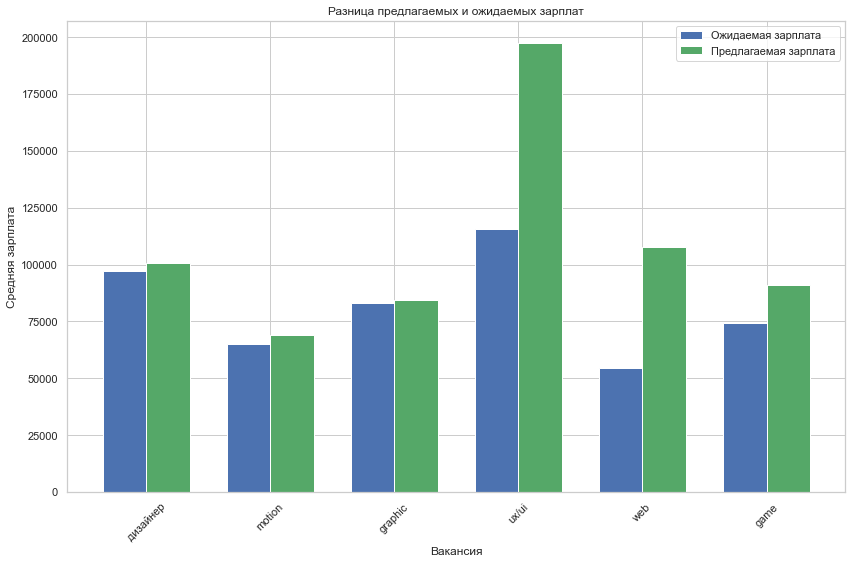

In [1034]:
# Получение топ-6 вакансий по количеству из каждого датасета
top_vacancies_dtframe = dtframe['standardized_name'].value_counts().head(6).index.tolist()
top_vacancies_dtfrv = dtfrv['standardized_name'].value_counts().head(6).index.tolist()

# Фильтрация данных только для топ-6 вакансий из каждого датасета
filtered_dtframe = dtframe[dtframe['standardized_name'].isin(top_vacancies_dtframe)]
filtered_dtfrv = dtfrv[dtfrv['standardized_name'].isin(top_vacancies_dtfrv)]

# Получение средних зарплат для каждой вакансии из топ-6
mean_salaries_dtframe = filtered_dtframe.groupby('standardized_name')['converted_salary'].mean()
mean_salaries_dtfrv = filtered_dtfrv.groupby('standardized_name')['converted_salary'].mean()

# Построение столбчатой диаграммы сравнения средних зарплат для топ-6 вакансий
plt.figure(figsize=(12, 8))

bar_width = 0.35
index = np.arange(len(top_vacancies_dtframe))

plt.bar(index, mean_salaries_dtframe, width=bar_width, label='Ожидаемая зарплата', color='b', align='center')
plt.bar(index + bar_width, mean_salaries_dtfrv, width=bar_width, label='Предлагаемая зарплата', color='g', align='center')

plt.xlabel('Вакансия')
plt.ylabel('Средняя зарплата')
plt.title('Разница предлагаемых и ожидаемых зарплат')
plt.xticks(index + bar_width/2, top_vacancies_dtframe, rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

## Навыки

In [1101]:
dv_skill = dv.copy()

In [1103]:
empty_skills_mask = (dv_skill['skills'] == '')
empty_skills_count = empty_skills_mask.sum()

# Удаление строк с пустыми значениями в столбце 'skills'
dv_skill_cleaned = dv_skill[~empty_skills_mask]

In [1105]:
dv_skill_cleaned[dv_skill_cleaned['skills'] == '']

,name,salary,required_experience,employment,description,skills,time_publication,place,normalized_name,standardized_name


In [1130]:
dv_skill_cleaned

,name,salary,required_experience,employment,description,skills,time_publication,place,normalized_name,standardized_name
0,Lead Game Designer,,3–6 лет,"Полная занятость, удаленная работа","\n\n\n\n\n\n\n\n\n\nВы - наш человек, если у в...","Gamedev, Управление командой",11 мая 2024,Москве,lead game дизайнер,game
1,Game Designer (Core),,не требуется,"Полная занятость, полный день","Привет!Мы - команда BLACKHUB Games, и сейчас м...","JSON API, F2P, A/B тесты, Проектная документация",11 мая 2024,Санкт-Петербурге,game дизайнер core,game
3,Game Designer Мета-геймплея,,1–3 года,"Полная занятость, полный день",Lesta Games ведёт разработку игровых проектов ...,"Game Design, Gamedev, Английский язык",11 мая 2024,Санкт-Петербурге,game дизайнер мета gameплея,game
4,Game Designer (стажер),,не требуется,"Стажировка, полный день",Lesta Games ведёт разработку игровых проектов ...,"Английский язык, Game Design, Управление време...",11 мая 2024,Санкт-Петербурге,game дизайнер стажер,game
5,Game Designer (Стажёр),,не требуется,"Стажировка, полный день",Компания East Games при поддержке генерального...,"Английский язык, Аналитическое мышление, Теори...",11 мая 2024,Ташкенте,game дизайнер стажёр,game
...,...,...,...,...,...,...,...,...,...,...
2629,Продуктовый дизайнер,,3–6 лет,"Полная занятость, удаленная работа",Привет! Мы — команда образовательной платформы...,"Figma, Работа в команде, Управление проектами, UX",23 апреля 2024,Москве,product дизайнер,product
2630,Дизайнер,,1–3 года,"Частичная занятость, удаленная работа",Changellenge >> — ведущая платформа по карьерн...,"Дизайн, Figma",15 апреля 2024,Москве,дизайнер,дизайнер
2632,Graphic Designer (Marketing),,1–3 года,"Полная занятость, полный день",\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n...,"Graphic Design, Microsoft Office, English, Des...",24 апреля 2024,Ташкенте,graphic дизайнер marketing,graphic
2635,Дизайнер обложек для Youtube,от 900 $ на руки,1–3 года,"Полная занятость, полный день",,"Творческое мышление, Adobe Photoshop, Фотография",18 апреля 2024,Алматы,дизайнер обложек для youtube,дизайнер


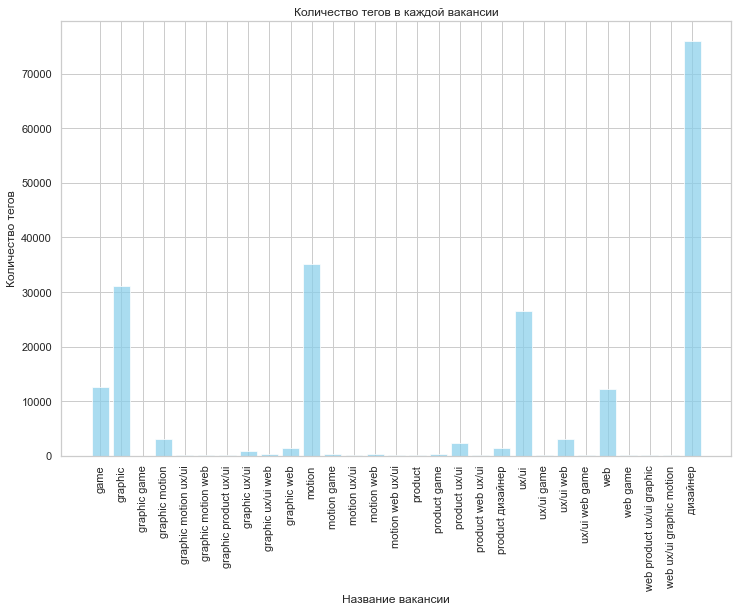

In [1145]:
# Функция для подсчета количества тегов
def count_tags(tag_list):
    if isinstance(tag_list, list):
        return len(tag_list)
    else:
        return 0

# Применение функции для подсчета количества тегов
dtframe['tags_count'] = dtframe['processed_tags'].apply(count_tags)

# Группировка данных по названию вакансии и суммирование количества тегов
df_tags_grouped = dtframe.groupby('standardized_name')['tags_count'].sum().reset_index()
df_tags_grouped
# Построение графика количества тегов для каждой вакансии
plt.figure(figsize=(12, 8))
plt.bar(df_tags_grouped['standardized_name'], df_tags_grouped['tags_count'], color='skyblue', alpha=0.7)
plt.xlabel('Название вакансии')
plt.ylabel('Количество тегов')
plt.title('Количество тегов в каждой вакансии')
plt.xticks(rotation=90)  # Поворот меток по оси X для лучшей читаемости
plt.show()

<ipython-input-1137-f22c0713aceb>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dv_skill_cleaned['skills_count'] = dv_skill_cleaned['skills'].apply(lambda x: count_skills(x) if isinstance(x, str) else 0)


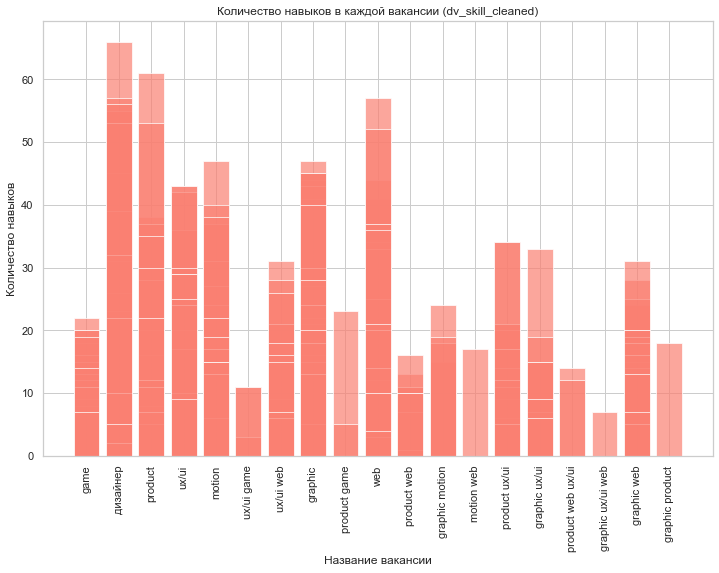

In [1137]:
# Функция для подсчета количества слов (навыков)
def count_skills(text):
    if pd.isna(text):  # Обработка пропущенных значений
        return 0
    return len(text.split())

# Подсчет количества навыков для каждой вакансии в dv_skill_cleaned
dv_skill_cleaned['skills_count'] = dv_skill_cleaned['skills'].apply(lambda x: count_skills(x) if isinstance(x, str) else 0)

# Построение графика количества навыков для каждой вакансии
plt.figure(figsize=(12, 8))
plt.bar(dv_skill_cleaned['standardized_name'], dv_skill_cleaned['skills_count'], color='salmon', alpha=0.7)
plt.xlabel('Название вакансии')
plt.ylabel('Количество навыков')
plt.title('Количество навыков в каждой вакансии (dv_skill_cleaned)')
plt.xticks(rotation=90)  # Поворот меток по оси X для лучшей читаемости
plt.show()

## Описание вакансий

In [1124]:
dv_descr = dv.copy()

In [1117]:
dv_descr

,name,salary,required_experience,employment,description,skills,time_publication,place,normalized_name,standardized_name
0,Lead Game Designer,,3–6 лет,"Полная занятость, удаленная работа","\n\n\n\n\n\n\n\n\n\nВы - наш человек, если у в...","Gamedev, Управление командой",11 мая 2024,Москве,lead game дизайнер,game
1,Game Designer (Core),,не требуется,"Полная занятость, полный день","Привет!Мы - команда BLACKHUB Games, и сейчас м...","JSON API, F2P, A/B тесты, Проектная документация",11 мая 2024,Санкт-Петербурге,game дизайнер core,game
2,Game Designer (Economy/Monetization designer),,3–6 лет,"Полная занятость, полный день",Lesta Games (ООО «Гейм Стрим» – минский центр ...,,11 мая 2024,Минске,game дизайнер economy monetization дизайнер,game
3,Game Designer Мета-геймплея,,1–3 года,"Полная занятость, полный день",Lesta Games ведёт разработку игровых проектов ...,"Game Design, Gamedev, Английский язык",11 мая 2024,Санкт-Петербурге,game дизайнер мета gameплея,game
4,Game Designer (стажер),,не требуется,"Стажировка, полный день",Lesta Games ведёт разработку игровых проектов ...,"Английский язык, Game Design, Управление време...",11 мая 2024,Санкт-Петербурге,game дизайнер стажер,game
...,...,...,...,...,...,...,...,...,...,...
2632,Graphic Designer (Marketing),,1–3 года,"Полная занятость, полный день",\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n...,"Graphic Design, Microsoft Office, English, Des...",24 апреля 2024,Ташкенте,graphic дизайнер marketing,graphic
2633,3D Моушен-дизайнер,от 80 до 120 ₽ на руки,3–6 лет,"Проектная работа/разовое задание, полный день",Обязанности: Создание видео-контента и аними...,,1 мая 2024,Москве,3d motion дизайнер,motion
2634,Графический дизайнер,от 70 ₽ на руки,1–3 года,"Полная занятость, полный день","EWA PRODUCT - молодая, амбициозная компания, к...",,16 апреля 2024,Новосибирске,graphic дизайнер,graphic
2635,Дизайнер обложек для Youtube,от 900 $ на руки,1–3 года,"Полная занятость, полный день",,"Творческое мышление, Adobe Photoshop, Фотография",18 апреля 2024,Алматы,дизайнер обложек для youtube,дизайнер


In [1123]:
def cleanDescription(txt):
    
    # Удаление ссылок (URL)
    cleanText = re.sub(r'http\S+', ' ', txt)
    
    # Удаление RT и cc
    cleanText = re.sub(r'\b(RT|cc)\b', ' ', cleanText)
    
    # Удаление хэштегов
    cleanText = re.sub(r'#\S+', ' ', cleanText)
    
    # Удаление упоминаний пользователей (@username)
    cleanText = re.sub(r'@\S+', ' ', cleanText)
    
    # Удаление специальных символов, кроме буквенно-цифровых символов и пробелов
    cleanText = re.sub(r'[^\w\s]', ' ', cleanText)
    
    # Удаление лишних пробелов
    cleanText = re.sub(r'\s+', ' ', cleanText)
    
    return cleanText.strip()  # Удаление пробелов в начале и в конце строки

In [1125]:
dv_descr['description'] = dv_descr['description'].apply(lambda x: cleanDescription(x))

In [1128]:
dv_descr['description'].iloc[0]

'Вы наш человек если у вас есть опыт управления командой от 5 человек глубокое понимание принципов игрового дизайна опыт работы на F2P мобильных играх четкое понимание тенденций FTP механик опыт оперирования мидкорными проектами сильные лидерские качества умение вести за собой команду обширный игровой опыт и глубокое знание рынка Пригодится опыт работы в Unity Кое что о задачах управление и развитие команды геймдизайнеров планирование и расстановка приоритетов для команды контроль и улучшение игрового процесса механик экономики и монетизации ведение проектной документации участие в формировании стратегии развития проекта совместно с продюсером и топ менеджментом подготовка технических заданий для разработчиков и арт команды межкомандное взаимодействие Помимо работы лекции от топовых спикеров нашего профиля воркшопы с лучшими специалистами индустрии крутые внутренние ивенты среда день посвящённый играм и саморазвитию геймифицированная бонусная система собственная медицинская диагностиче

In [1122]:
dv['description'].iloc[0]

'\n\n\n\n\n\n\n\n\n\nВы - наш человек, если у вас есть:  опыт управления командой от 5 человек глубокое понимание принципов игрового дизайна опыт работы на F2P мобильных играх, четкое понимание тенденций FTP-механик опыт оперирования мидкорными проектами сильные лидерские качества, умение вести за собой команду обширный игровой опыт и глубокое знание рынка  Пригодится:  опыт работы в Unity  Кое-что о задачах:  управление и развитие команды геймдизайнеров планирование и расстановка приоритетов для команды контроль и улучшение игрового процесса, механик, экономики и монетизации ведение проектной документации участие в формировании стратегии развития проекта совместно с продюсером и топ-менеджментом подготовка технических заданий для разработчиков и арт-команды межкомандное взаимодействие  Помимо работы:  лекции от топовых спикеров нашего профиля воркшопы с лучшими специалистами индустрии крутые внутренние ивенты среда - день, посвящённый играм и саморазвитию геймифицированная бонусная си

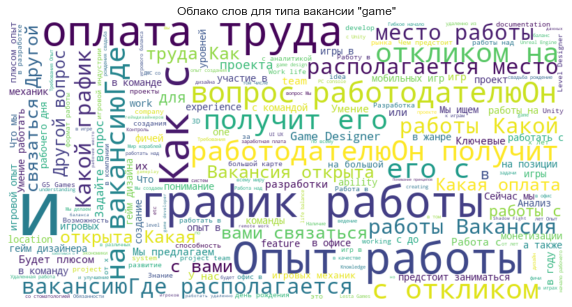

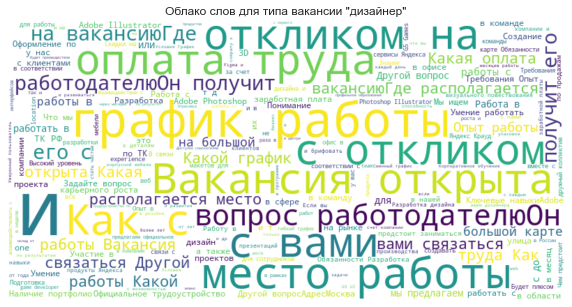

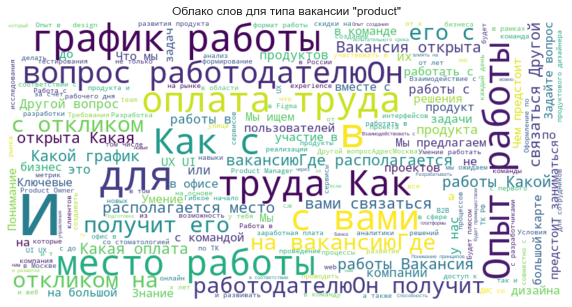

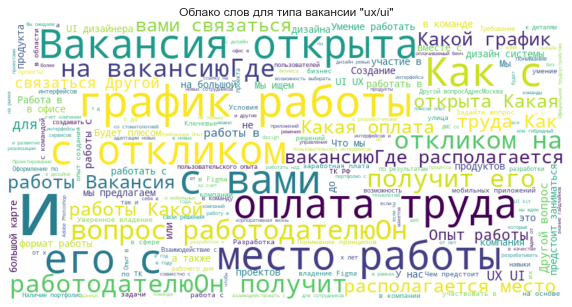

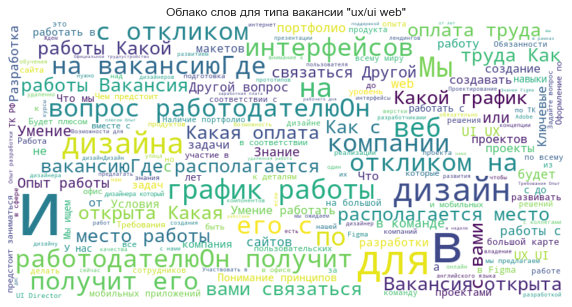

...

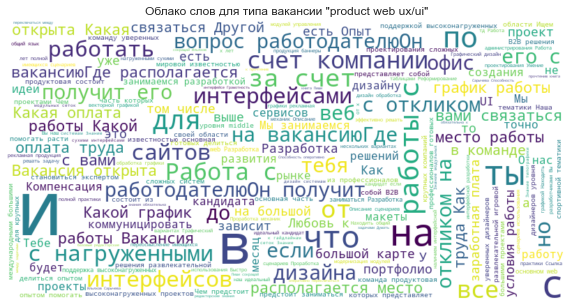

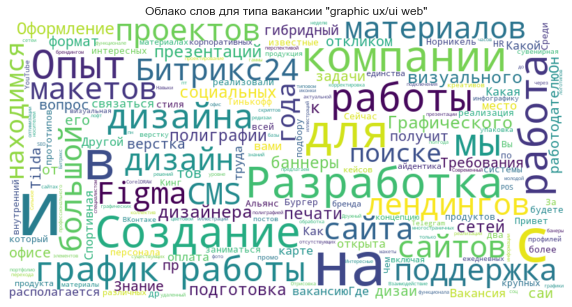

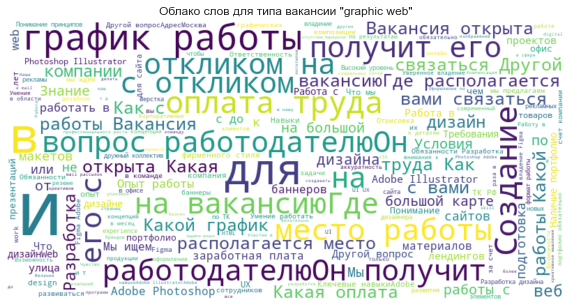

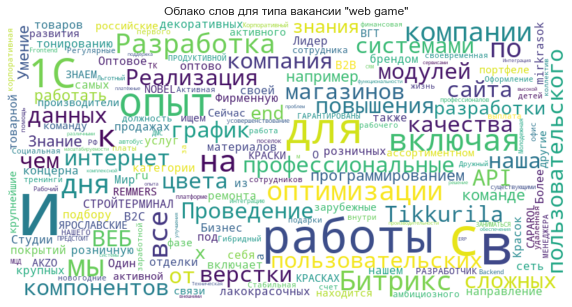

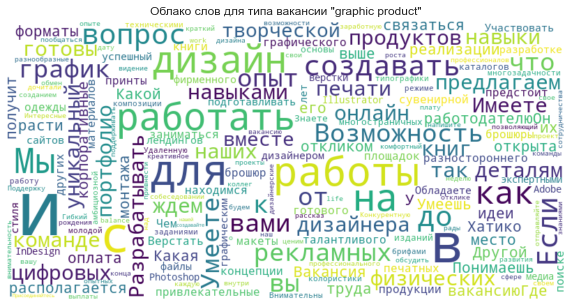

In [1165]:
# Функция для построения облака слов по описаниям вакансий определенного типа
def create_wordcloud_for_type(type_name, descriptions):
    type_descriptions = ' '.join(descriptions)
    wordcloud = WordCloud(width=800, height=400, random_state=21, max_font_size=110, background_color='white').generate(type_descriptions)
    plt.figure(figsize=(10, 6), facecolor='white')
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f'Облако слов для типа вакансии "{type_name}"')
    plt.show()

# Получение уникальных типов вакансий
unique_types = dv_descr['standardized_name'].unique()

# Построение облака слов для каждого уникального типа вакансии
for type_name in unique_types:
    filtered_descriptions = dv_descr[dv_descr['standardized_name'] == type_name]['description']
    create_wordcloud_for_type(type_name, filtered_descriptions)